In [2]:
pip install geopandas

     ---------------------------------------- 1.1/1.1 MB 3.2 MB/s eta 0:00:00
     ---------------------------------------- 22.9/22.9 MB 4.7 MB/s eta 0:00:00
     ---------------------------------------- 6.1/6.1 MB 4.9 MB/s eta 0:00:00
     ---------------------------------------- 1.4/1.4 MB 2.8 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install osmnx

     -------------------------------------- 104.3/104.3 kB 3.0 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install networkx

Note: you may need to restart the kernel to use updated packages.


In [7]:
pip install descartes

Note: you may need to restart the kernel to use updated packages.


In [8]:
import numpy as np
import pandas as pd 
import geopandas as gpd
import matplotlib.pyplot as plt
import osmnx as ox
import networkx as nx
from descartes import PolygonPatch
from shapely.geometry import Point, Polygon, MultiPolygon, LineString
from tqdm.auto import tqdm
import shapely.speedups
shapely.speedups.enable() 
import warnings
warnings.filterwarnings('ignore')

C:\Users\ASUS\AppData\Local\Temp\ipykernel_16920\2778500982.py:11: DeprecationWarning: This function has no longer any effect, and will be removed in a future release. Starting with Shapely 2.0, equivalent speedups are always available
  shapely.speedups.enable()


In [9]:
PLACE_NAME = 'Berlin, Germany'
name = 'berlin'
grid_size = 500

epsg:4326
EPSG:32633
<class 'shapely.geometry.multipolygon.MultiPolygon'>


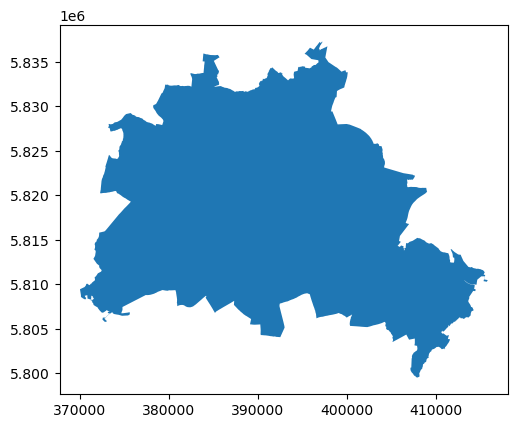

In [10]:
city = ox.geocode_to_gdf(PLACE_NAME)
print(city.crs)
## changing CRS for grid division
city = ox.project_gdf(city) 
print(city.crs)
ax = city.plot()
geometry = city['geometry'].iloc[0]
print(type(geometry))

In [12]:
#save geometry
city.to_file(f"C:/Users/ASUS/OneDrive/DataScience/FINAL-PROJECT/data-science-Optimal-EV-station-placement-main/main_raw/figures{name}.shp")

#### Division into grid

In [13]:
geometry_cut = ox.utils_geo._quadrat_cut_geometry(geometry, quadrat_width=grid_size) #500 Meter grid
print(type(geometry_cut))
polylist = [poly for poly in geometry_cut.geoms]

<class 'shapely.geometry.multipolygon.MultiPolygon'>


IndexError: too many indices for array: array is 0-dimensional, but 2 were indexed

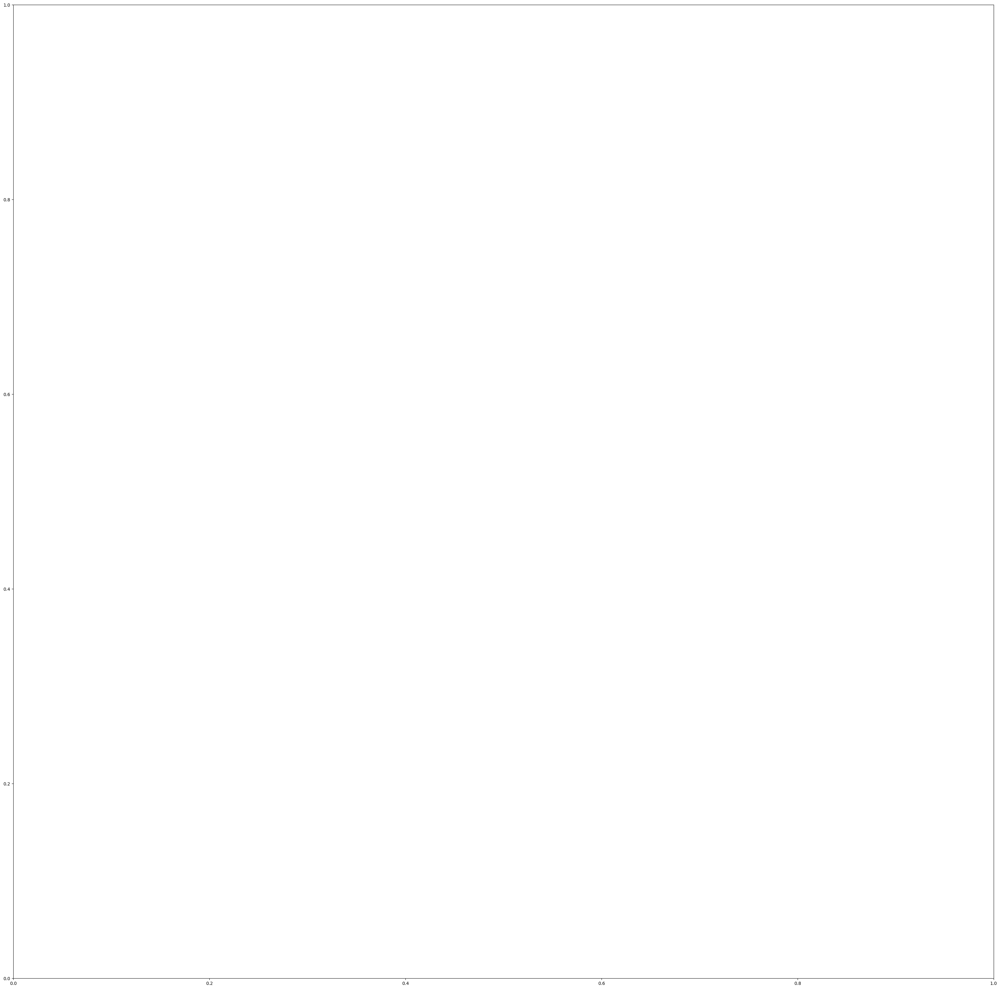

In [15]:
polylist = [poly for poly in geometry_cut.geoms]
# plot city
west, south, east, north = city.unary_union.bounds

fig, ax = plt.subplots(figsize=(40,40))
for polygon, n in zip(geometry_cut.geoms, np.arange(len(polylist))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5, zorder=2)
    ax.add_patch(patch)
    plt.annotate(text=n, xy=p, horizontalalignment='center', size=7)
    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

In [16]:
city_polyframe = gpd.GeoDataFrame(geometry=polylist)
city_polyframe.crs = city.crs
print(city_polyframe.crs)
city_polyframe.head()

EPSG:32633


,geometry
0,"POLYGON ((370000.652 5809431.569, 370043.043 5..."
1,"POLYGON ((370043.043 5809451.849, 370498.326 5..."
2,"POLYGON ((370498.326 5808955.286, 370498.326 5..."
3,"POLYGON ((370498.326 5808458.723, 370498.326 5..."
4,"POLYGON ((370498.326 5809669.660, 370517.094 5..."


In [18]:
pip install contextily

     -------------------------------------- 125.4/125.4 kB 3.7 MB/s eta 0:00:00
     ---------------------------------------- 23.4/23.4 MB 4.8 MB/s eta 0:00:00
     -------------------------------------- 40.3/40.3 kB 970.5 kB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x0000020AB7291450>

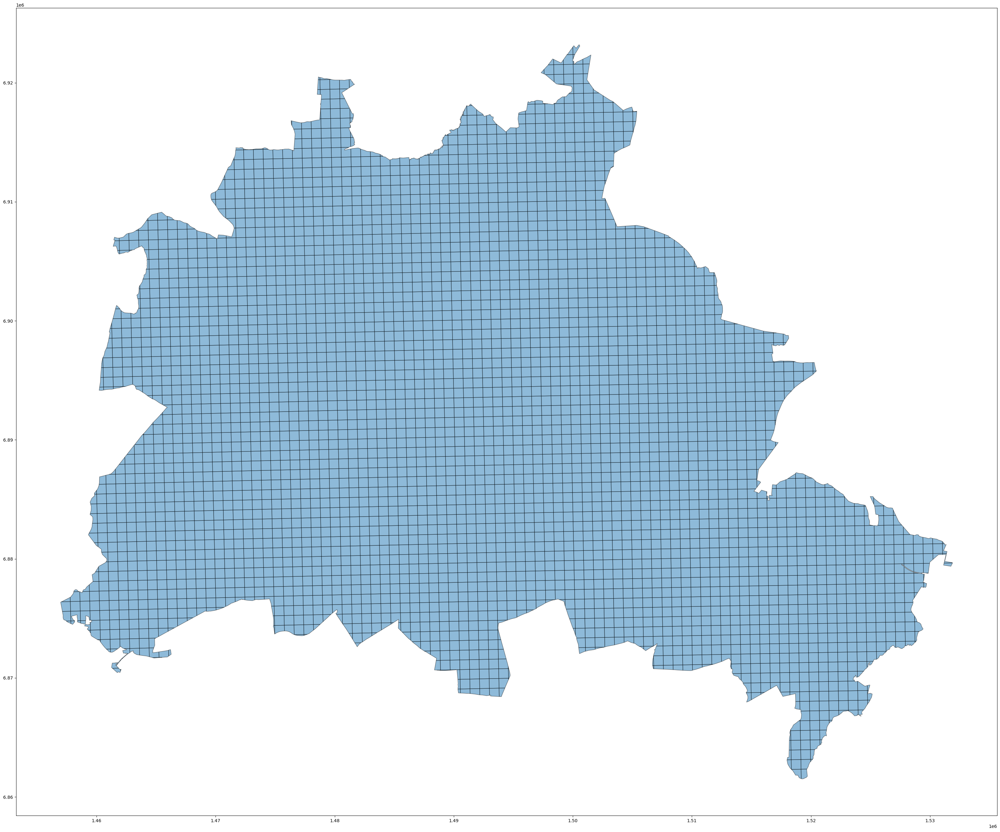

In [19]:
import contextily as ctx
# ctx uses epsg:3857ax = city.plot()
polyframe_3857 = city_polyframe.to_crs(epsg=3857)
west, south, east, north = polyframe_3857.unary_union.bounds

ax = polyframe_3857.plot(figsize=(40,40), alpha=0.5, edgecolor='k')
ctx.add_basemap(ax, zoom=13)
ax.set_xlim(west, east)
ax.set_ylim(south, north)

#### POIs
- Understanding each one of them and making dataset

In [8]:
city_polyframe_lat_long = ox.project_gdf(city_polyframe, to_latlong=True) #Changing CRS to (Lat, long)
city_polyframe_lat_long.head()

,geometry
0,"POLYGON ((13.08835 52.41963, 13.08896 52.41982..."
1,"POLYGON ((13.08896 52.41982, 13.09557 52.42189..."
2,"POLYGON ((13.09584 52.41547, 13.09604 52.41101..."
3,"POLYGON ((13.09604 52.41101, 13.09609 52.40978..."
4,"POLYGON ((13.09557 52.42189, 13.09584 52.42198..."


##### 1. EV stations

In [9]:
EV_stations = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "charging_station"},
)
EV_stations.head()
# EV_stations.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-EV_stations.csv")

amenity amperage  \
element_type osmid                                  
node         425089052  charging_station       32   
             429740871  charging_station       32   
             429951629  charging_station       32   
             520518082  charging_station       32   
             610981736  charging_station       32   

                       authentication:short_message capacity       operator  \
element_type osmid                                                            
node         425089052                          yes        2  RWE-Effizienz   
             429740871                          yes        2         Innogy   
             429951629                          yes        2         Innogy   
             520518082                          NaN        2     Vattenfall   
             610981736                          yes        2  RWE-Effizienz   

                                          ref socket:type2  \
element_type osmid                                           
node         425089052  BA-0602-4 / BA-0603-0            2   
             429740871  BA-0500-2 / BA-0501-9            2   
             429951629  BA-0798-1 / BA-0707-5            2   
             520518082                    NaN            2   
             610981736  BA-0489-6 / BA-0487-3            2   

                                              source source:delivery_date  \
element_type osmid                                                          
node         425089052  RWE Effizienz GmbH, Dortmund           2011/01/17   
             429740871                           NaN                  NaN   
             429951629  RWE Effizienz GmbH, Dortmund           2011/01/17   
             520518082                           NaN                  NaN   
             610981736                           NaN                  NaN   

                       voltage  ... image image:0 image:1 nodes parking  \
element_type osmid              ...                                       
node         425089052     400  ...   NaN     NaN     NaN   NaN     NaN   
             429740871     400  ...   NaN     NaN     NaN   NaN     NaN   
             429951629     400  ...   NaN     NaN     NaN   NaN     NaN   
             520518082     NaN  ...   NaN     NaN     NaN   NaN     NaN   
             610981736     NaN  ...   NaN     NaN     NaN   NaN     NaN   

                       parking:orientation surface capacity:disabled  \
element_type osmid                                                     
node         425089052                 NaN     NaN               NaN   
             429740871                 NaN     NaN               NaN   
             429951629                 NaN     NaN               NaN   
             520518082                 NaN     NaN               NaN   
             610981736                 NaN     NaN               NaN   

                       parking_space orientation  
element_type osmid                                
node         425089052           NaN         NaN  
             429740871           NaN         NaN  
             429951629           NaN         NaN  
             520518082           NaN         NaN  
             610981736           NaN         NaN  

[5 rows x 141 columns]

Text(0.5, 1.0, 'Berlin EV stations')

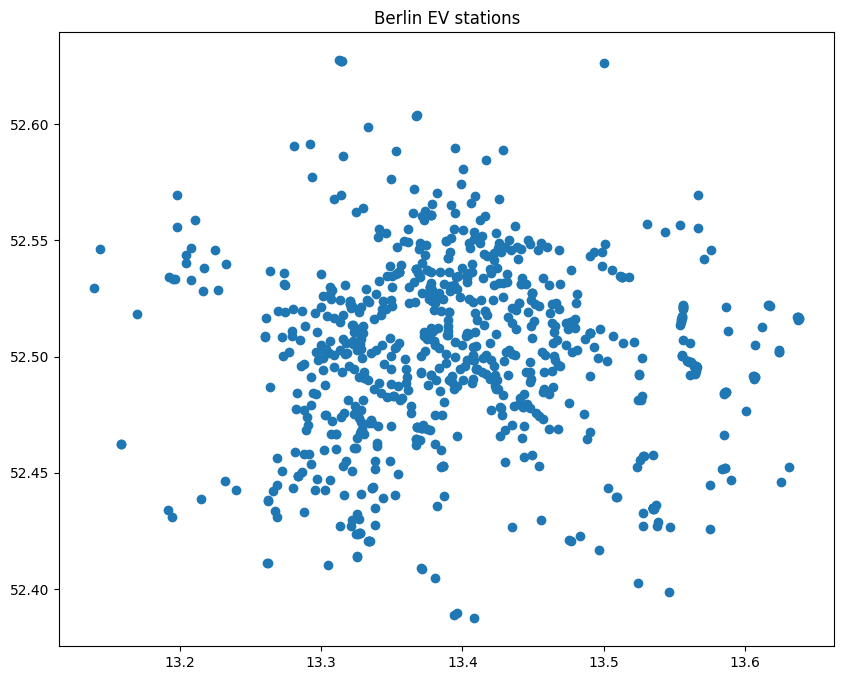

In [10]:
#plot EV stations geo data
EV_stations.plot(figsize=(10,10))
plt.title("Berlin EV stations")

Text(0.5, 1.0, 'Berlin EV stations')

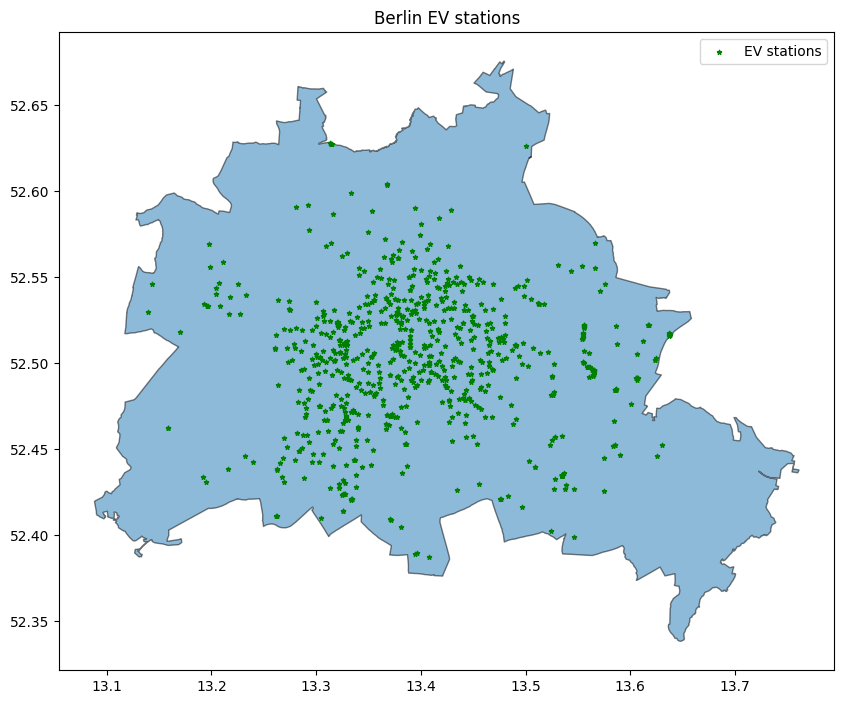

In [11]:
fig, ax = plt.subplots(figsize=(10,10))
ox.project_gdf(city, to_latlong=True).plot(ax =ax, alpha=0.5, edgecolor='k')
EV_stations.plot(ax=ax, color='green', marker='*', markersize=10)
#add legend
plt.legend(['EV stations'])
plt.title("Berlin EV stations")

Text(0.5, 1.0, 'Berlin EV stations')

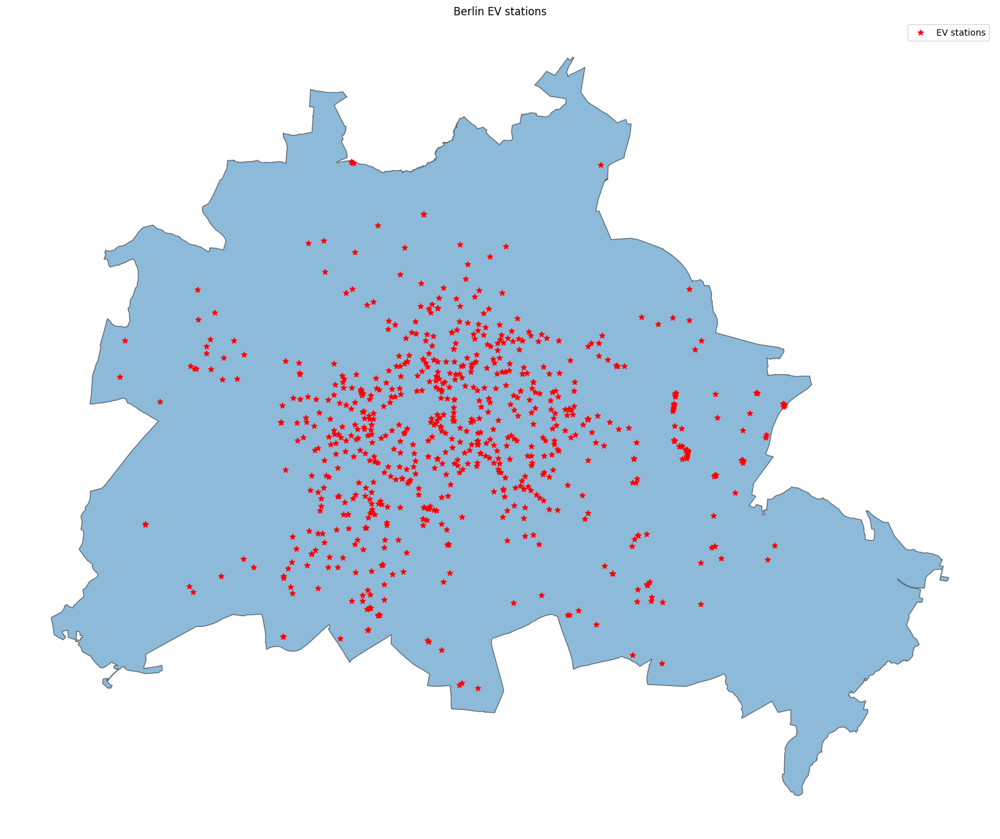

In [27]:
fig, ax = plt.subplots(figsize=(20,20))
ox.project_gdf(city, to_latlong=True).plot(ax =ax, alpha=0.5, edgecolor='k')
EV_stations.plot(ax=ax, color='red', marker='*', markersize=40)
#add legend
plt.axis('off')
plt.legend(['EV stations'])
plt.title("Berlin EV stations")

In [14]:
list(EV_stations.columns)

['amenity',
 'amperage',
 'authentication:short_message',
 'capacity',
 'operator',
 'ref',
 'socket:type2',
 'source',
 'source:delivery_date',
 'voltage',
 'geometry',
 'brand',
 'brand:wikidata',
 'brand:wikipedia',
 'name',
 'opening_hours',
 'operator:wikidata',
 'operator:wikipedia',
 'note:de',
 'authentication:membership_card',
 'payment:account_cards',
 'description',
 'access',
 'authentication:app',
 'authentication:nfc',
 'contact:phone',
 'contact:website',
 'fee',
 'motorcar',
 'parking:fee',
 'socket:type2:output',
 'addr:suburb',
 'wheelchair',
 'socket:type2:current',
 'socket:type2:voltage',
 'survey:date',
 'payment:mastercard',
 'payment:paypal',
 'payment:visa',
 'location',
 'authentication:phone_call',
 'layer',
 'level',
 'socket:schuko',
 'short_name',
 'website',
 'charge',
 'payment:american_express',
 'payment:sepa',
 'payment:vpay',
 'comment',
 'addr:city',
 'addr:housenumber',
 'addr:postcode',
 'addr:street',
 'phone',
 'bicycle',
 'authentication:none',

In [15]:
assert np.sum(EV_stations['amenity'].values == 'charging_station') ==  len(EV_stations) #amenity column
### investigating important columns
EV_stations['geometry'].head() #geometry column

element_type  osmid    
node          425089052    POINT (13.32270 52.51363)
              429740871    POINT (13.38087 52.52366)
              429951629    POINT (13.32897 52.49940)
              520518082    POINT (13.32540 52.50281)
              610981736    POINT (13.27370 52.53583)
Name: geometry, dtype: geometry

In [16]:
#check null values out of toital values
print(EV_stations['amperage'].isnull().sum() / len(EV_stations)) #amperage column
print(EV_stations['voltage'].isnull().sum() / len(EV_stations)) #voltage column
print(EV_stations['capacity'].isnull().sum() / len(EV_stations)) #capacity column
print(EV_stations['socket:type2'].isnull().sum() / len(EV_stations)) #socket column
#output column
print(EV_stations['output'].isnull().sum() / len(EV_stations)) #output column
#parking column
print(EV_stations['parking'].isnull().sum() / len(EV_stations)) #parking column
#charging_station:output column

0.8323207776427703
0.8797083839611178
0.12636695018226002
0.5261239368165249
0.9963547995139733
0.9975698663426489


In [17]:
#intersection of points and polygons
import shapely.speedups
shapely.speedups.enable() 

masks_EV = []
for i in tqdm(range(0,city_polyframe.shape[0])):
    pip_mask = EV_stations.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_EV.append(pip_mask)

/tmp/ipykernel_6216/3985573752.py:3: DeprecationWarning: This function has no longer any effect, and will be removed in a future release. Starting with Shapely 2.0, equivalent speedups are always available
  shapely.speedups.enable()
100%|██████████| 3891/3891 [00:00<00:00, 26547.26it/s]


In [18]:
#extract ['amperage', 'voltage', 'amenity', 'capacity'] columns
EV_stations[masks_EV[1438]][['amperage', 'voltage', 'amenity', 'capacity', 'geometry']]

amperage voltage           amenity capacity  \
element_type osmid                                                    
node         1244656914      NaN     NaN  charging_station        2   
             1272542304       32     400  charging_station        2   

                                          geometry  
element_type osmid                                  
node         1244656914  POINT (13.35496 52.50582)  
             1272542304  POINT (13.34901 52.50779)

In [19]:
#EV stations in the 3022 grid (example)
EV_stations[masks_EV[3022]][['amperage', 'voltage', 'amenity', 'capacity', 'geometry']]

amperage voltage           amenity capacity  \
element_type osmid                                                     
node         10166352020      NaN     NaN  charging_station      NaN   
             10166352021      NaN     NaN  charging_station      NaN   
             10166352022      NaN     NaN  charging_station      NaN   
             10166352023      NaN     NaN  charging_station      NaN   
             10166352024      NaN     NaN  charging_station      NaN   
             10817777040      NaN     NaN  charging_station      NaN   
             10817777043      NaN     NaN  charging_station      NaN   
             10817777044      NaN     NaN  charging_station      NaN   
             10817777055      NaN     NaN  charging_station      NaN   
             10817777056      NaN     NaN  charging_station      NaN   
             10961226421      NaN     NaN  charging_station        1   

                                           geometry  
element_type osmid                                   
node         10166352020  POINT (13.56369 52.49610)  
             10166352021  POINT (13.56406 52.49606)  
             10166352022  POINT (13.56446 52.49601)  
             10166352023  POINT (13.56495 52.49596)  
             10166352024  POINT (13.56528 52.49592)  
             10817777040  POINT (13.56566 52.49554)  
             10817777043  POINT (13.56560 52.49534)  
             10817777044  POINT (13.56553 52.49512)  
             10817777055  POINT (13.56526 52.49452)  
             10817777056  POINT (13.56514 52.49379)  
             10961226421  POINT (13.56155 52.49780)

In [20]:
# create a new geodataframe with mask EV stations 
EV_stations_masked = gpd.GeoDataFrame()
for i in tqdm(range(0,city_polyframe.shape[0])):
    EV_stations_masked = pd.concat([EV_stations_masked, EV_stations[masks_EV[i]][['amperage', 'voltage', 'amenity', 'capacity', 'geometry']]], ignore_index=True)

100%|██████████| 3891/3891 [00:07<00:00, 544.28it/s]


In [21]:
EV_stations[masks_EV[1438]]['amperage'].values.tolist()

[nan, '32']

In [22]:
berlin_polyframe_lat_long_new = city_polyframe_lat_long.copy()
berlin_polyframe_lat_long_new['EV_stations_counts'] = 0
berlin_polyframe_lat_long_new['EV_stations_aperage'] = 0
berlin_polyframe_lat_long_new['EV_stations_voltage'] = 0
berlin_polyframe_lat_long_new['EV_stations_capacity'] = 0
berlin_polyframe_lat_long_new['EV_stations_geomery'] = 0

In [23]:
for i in tqdm(range(0,berlin_polyframe_lat_long_new.shape[0])):
    berlin_polyframe_lat_long_new.loc[i, 'EV_stations_counts'] = EV_stations[masks_EV[i]].shape[0]
    berlin_polyframe_lat_long_new.loc[i, 'EV_stations_aperage'] = str(EV_stations[masks_EV[i]][['amperage']].values.tolist())
    berlin_polyframe_lat_long_new.loc[i, 'EV_stations_voltage'] = str(EV_stations[masks_EV[i]][['voltage']].values.tolist())
    berlin_polyframe_lat_long_new.loc[i, 'EV_stations_capacity'] = str(EV_stations[masks_EV[i]][['capacity']].values.tolist())
    berlin_polyframe_lat_long_new.loc[i, 'EV_stations_geomery'] = str(EV_stations[masks_EV[i]][['geometry']].values.tolist())

100%|██████████| 3891/3891 [00:18<00:00, 213.49it/s]


In [24]:
#How many EV stations in each grid
berlin_polyframe_lat_long_new['EV_stations_counts'].value_counts()
#Percentage of EV stations in each grid
berlin_polyframe_lat_long_new['EV_stations_counts'].value_counts() / berlin_polyframe_lat_long_new.shape[0]

EV_stations_counts
0     0.872012
1     0.078643
2     0.032382
3     0.008995
4     0.003855
5     0.002056
6     0.001285
7     0.000257
10    0.000257
11    0.000257
Name: count, dtype: float64

##### Population data visualize and add to each grid

In [25]:
#### Extract population data
df_pop = pd.read_csv("//home/akansh-i2sc/Downloads/Compressed/population_deu_2019-07-01.csv")
gdf = gpd.GeoDataFrame(df_pop, geometry=gpd.points_from_xy(df_pop.Lon, df_pop.Lat))

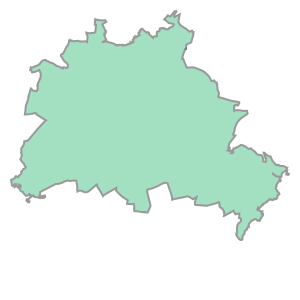

In [26]:
#extract population data for berlin
city.geometry[0]

In [27]:
# change crs to lat long
city_lat_long = ox.project_gdf(city, to_latlong=True)
pip_mask = gdf.within(city_lat_long.loc[0, 'geometry']) 

In [28]:
berlin_pop_gdf = gdf.loc[pip_mask]

<Axes: >

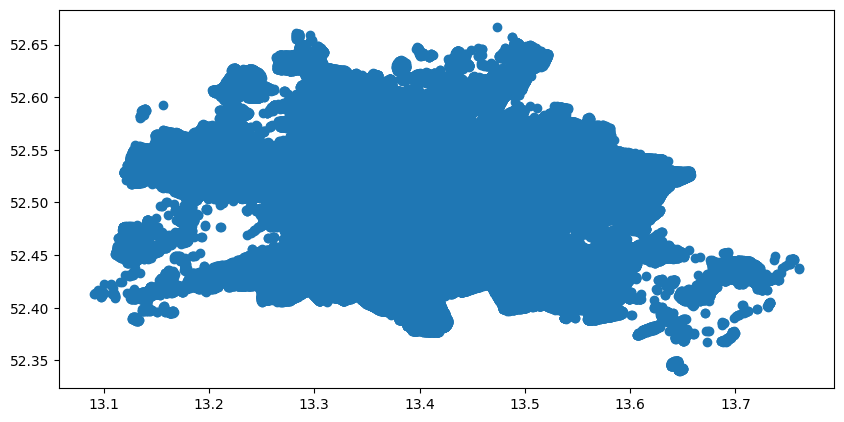

In [29]:
#plot population data with cmap
berlin_pop_gdf.plot(figsize=(10,10))

In [165]:
berlin_pop_gdf.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-population.csv")

In [30]:
# population for each grid
masks_pop = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = berlin_pop_gdf.within(city_polyframe_lat_long.loc[i, 'geometry'])
    masks_pop.append(pip_mask)

100%|██████████| 3891/3891 [00:20<00:00, 190.53it/s]


In [31]:
pop_grid = []
for i in range(0,city_polyframe_lat_long.shape[0]):
    pop_grid.append(berlin_pop_gdf.loc[masks_pop[i]].Population.mean())

In [32]:
pop_grid = np.nan_to_num(pop_grid)

In [33]:
berlin_polyframe_lat_long_new['population'] = pop_grid
berlin_polyframe_lat_long_new.head()

,geometry,EV_stations_counts,EV_stations_aperage,EV_stations_voltage,EV_stations_capacity,EV_stations_geomery,population
0,"POLYGON ((13.08835 52.41963, 13.08896 52.41982...",0,[],[],[],[],10.022101
1,"POLYGON ((13.08896 52.41982, 13.09557 52.42189...",0,[],[],[],[],0.000000
2,"POLYGON ((13.09584 52.41547, 13.09604 52.41101...",0,[],[],[],[],10.022101
3,"POLYGON ((13.09604 52.41101, 13.09609 52.40978...",0,[],[],[],[],0.000000
4,"POLYGON ((13.09557 52.42189, 13.09584 52.42198...",0,[],[],[],[],10.022101


/tmp/ipykernel_6216/2501586322.py:9: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(['EV stations'])


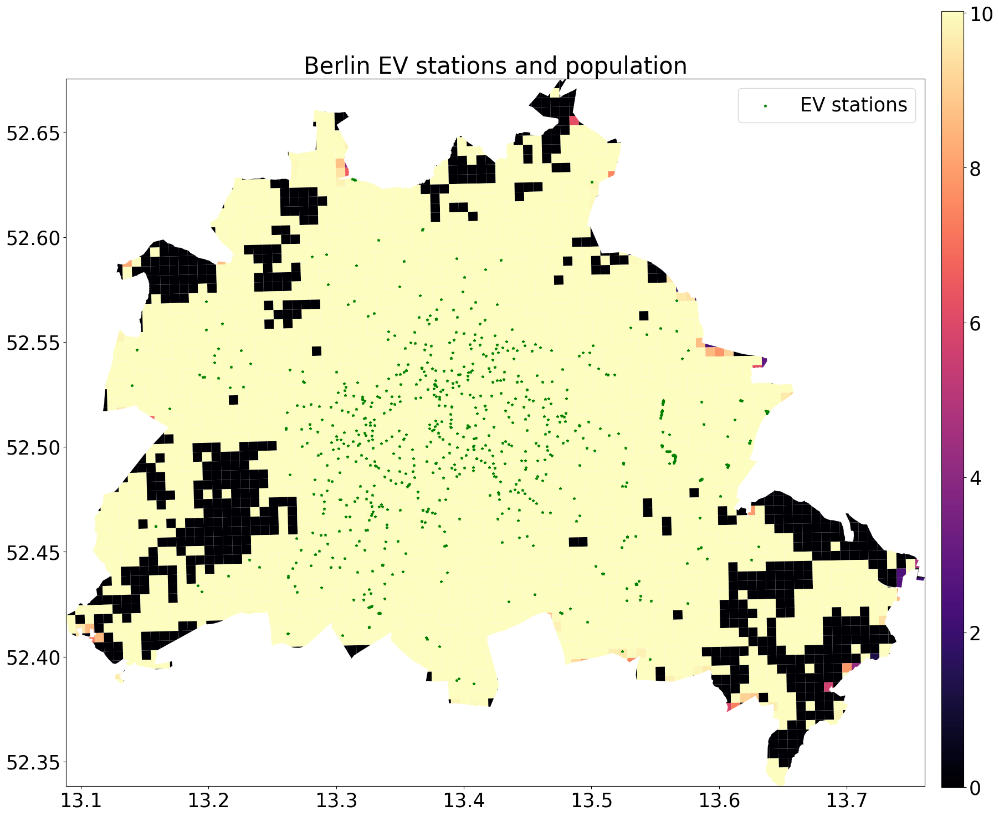

In [34]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'population', legend=False, cmap='magma')
# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')
# add legend
plt.legend(['EV stations'])
plt.title(f'{PLACE_NAME} EV stations and population')
cbax = fig.add_axes([0.915, 0.175, 0.02, 0.7])

sm = plt.cm.ScalarMappable(cmap='magma', \
                          norm = plt.Normalize(vmin=min(berlin_polyframe_lat_long_new.population), vmax=max(berlin_polyframe_lat_long_new.population)))
sm._A = []
# draw colormap into cbax
fig.colorbar(sm, cax=cbax, format="%d")
ax.set_xlim(west, east)
ax.set_ylim(south, north)
# ax.axis('off')30
plt.show()

##### LAnd_USE 

In [24]:
landuse = ox.geometries_from_place(PLACE_NAME, tags={'landuse': True})

# Define the categories
categories = {
    'residential': ['residential'],
    'commercial': ['commercial', 'retail', 'office', 'industrial'],
    'retail': ['retail'],
    'industrial': ['industrial']
}

# Create a new column to categorize the landuse types
landuse['category'] = 'Other'

# Iterate through the categories and assign the corresponding landuse types
for category, tags in categories.items():
    landuse.loc[landuse['landuse'].isin(tags), 'category'] = category

In [163]:
landuse.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-landuse.csv")

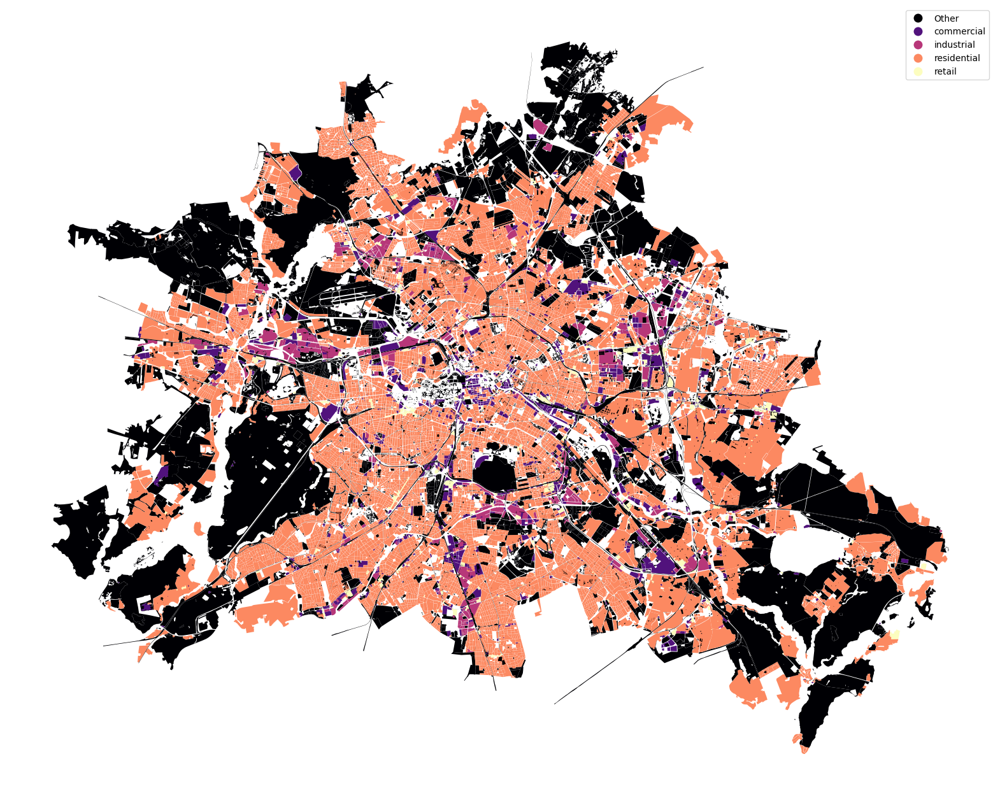

In [25]:
#plot node in landuse
fig, ax = plt.subplots(figsize=(20,20))
landuse.plot(ax=ax, column = 'category', legend=True, cmap='magma')
# plt.title(f'{PLACE_NAME} landuse')
plt.axis('off')
plt.show()

In [37]:
#create a copy of landuse drop everything except Category and geometry
landuse_cat = landuse[['category', 'geometry']].copy()

In [11]:
import shapely.speedups
shapely.speedups.enable()

/tmp/ipykernel_8697/3808896212.py:2: DeprecationWarning: This function has no longer any effect, and will be removed in a future release. Starting with Shapely 2.0, equivalent speedups are always available
  shapely.speedups.enable()


In [39]:
masks_land_use = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = landuse_cat.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_land_use.append(pip_mask)
    assert pip_mask.shape[0] == landuse_cat.shape[0]

100%|██████████| 3891/3891 [00:02<00:00, 1602.46it/s]


In [40]:
land_labels = []
for i in range(0,city_polyframe_lat_long.shape[0]):
    if landuse_cat[masks_land_use[i]].category.value_counts().isnull().all() == True:
        land_labels.append('Other')
    else:
        land_labels.append(landuse_cat[masks_land_use[i]].category.value_counts().index[0])

In [41]:
berlin_polyframe_lat_long_new['landuse'] = land_labels

In [42]:
berlin_polyframe_lat_long_new.landuse.value_counts()

landuse
Other          3272
residential     459
commercial       72
retail           50
industrial       38
Name: count, dtype: int64

/tmp/ipykernel_6216/2740752356.py:8: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


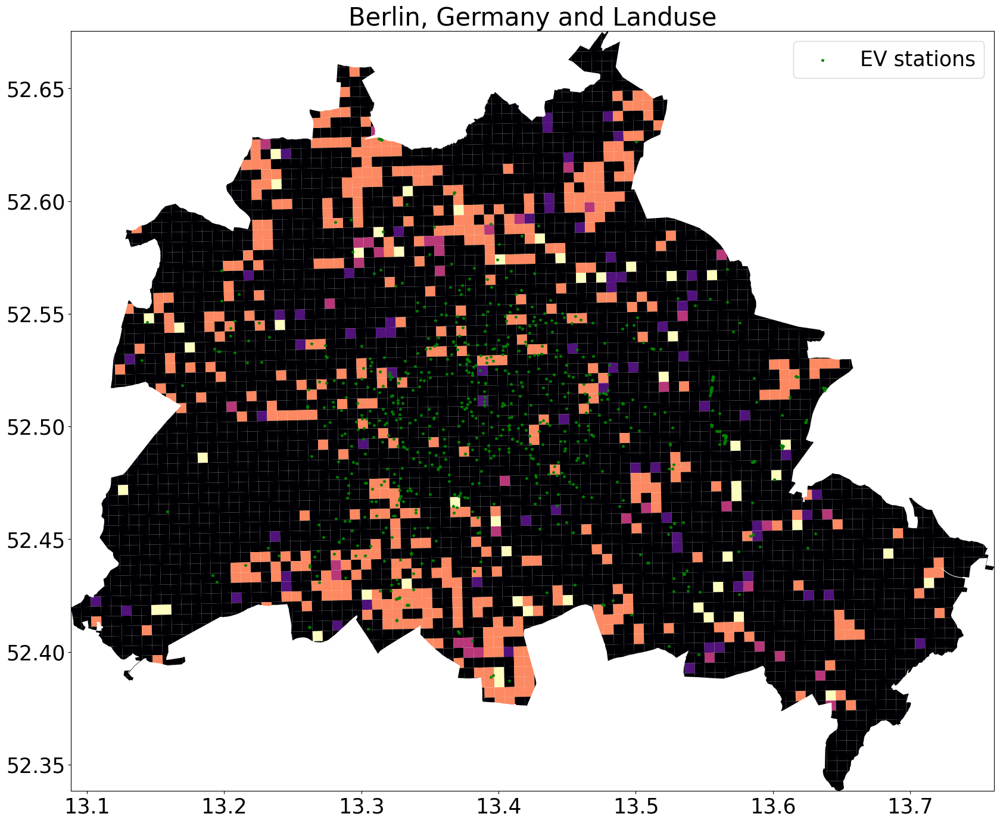

In [43]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'landuse', legend=False, cmap='magma')
# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')
ax.legend()
# add legend
plt.title(f'{PLACE_NAME} and Landuse')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
# ax.axis('off')30
plt.show()

##### Raod Connectivity

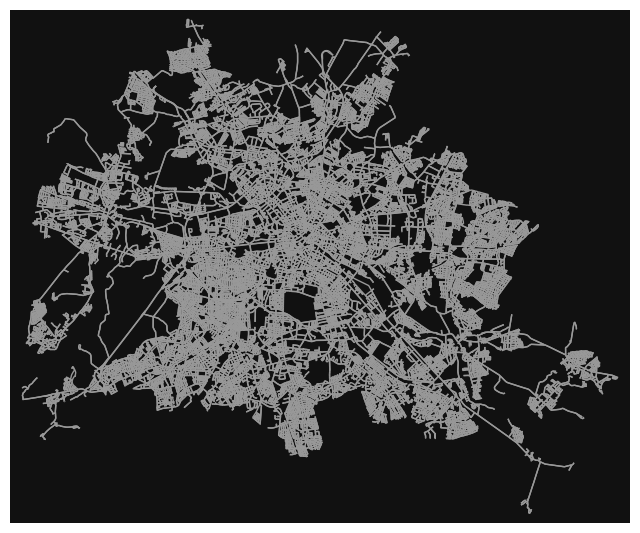

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [12]:
G = ox.graph_from_place(PLACE_NAME, network_type='drive')
ox.plot_graph(G, node_size= 0)

In [13]:
area,edges = ox.graph_to_gdfs(G)

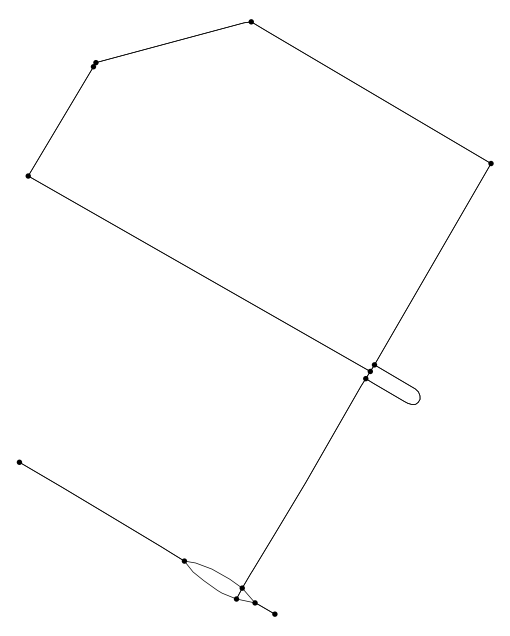

Number of nodes in the graph:  14
Number of edges in the graph:  30
Density of the graph:  0.16483516483516483


In [15]:
poly = city_polyframe_lat_long.loc[1254, 'geometry']
G_1 = ox.graph_from_polygon(poly, network_type='drive')
ox.plot_graph(G_1, edge_color='black', edge_linewidth=0.5, node_color='black', bgcolor='white')

#print number of nodes and edges and density
print('Number of nodes in the graph: ', len(list(G_1.nodes())))
print('Number of edges in the graph: ', len(list(G_1.edges())))
print('Density of the graph: ', nx.density(G_1))

In [59]:
#calculate number of edges and nodes for each grid
nodes = []
edges = []
density = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    try: 
        poly = city_polyframe_lat_long.loc[i, 'geometry']
        G = ox.graph_from_polygon(poly, network_type='drive')
        nodes.append(len(list(G.nodes())))
        edges.append(len(list(G.edges())))
        density.append(nx.density(G))
    except:
        nodes.append(0)
        edges.append(0)
        density.append(0)


100%|██████████| 3891/3891 [03:12<00:00, 20.18it/s]


In [60]:
#add nodes, edges and density to the dataframe
berlin_polyframe_lat_long_new['nodes'] = nodes
berlin_polyframe_lat_long_new['edges'] = edges
berlin_polyframe_lat_long_new['density'] = density

In [ ]:
#relation between EV stations and nodes


/tmp/ipykernel_6216/3231466269.py:11: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


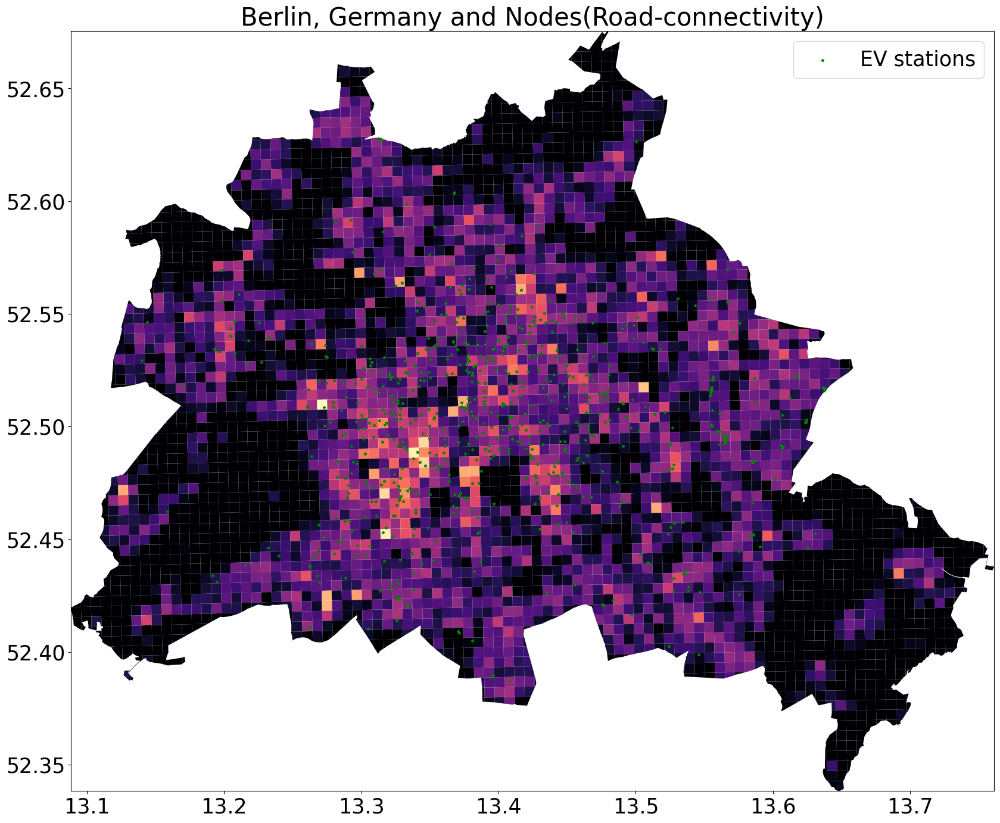

In [64]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

#nodes
fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'nodes', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and Nodes(Road-connectivity)')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

/tmp/ipykernel_6216/2103950948.py:11: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


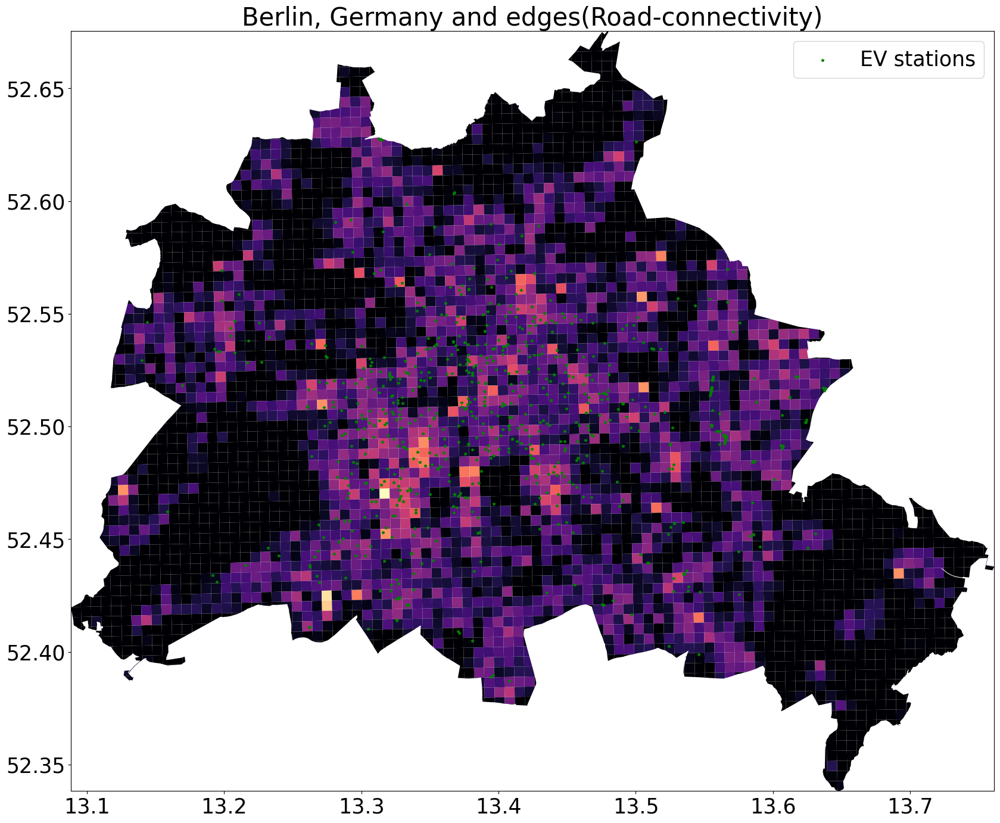

In [65]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

#nodes
fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'edges', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and edges(Road-connectivity)')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

/tmp/ipykernel_6216/3099643536.py:11: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


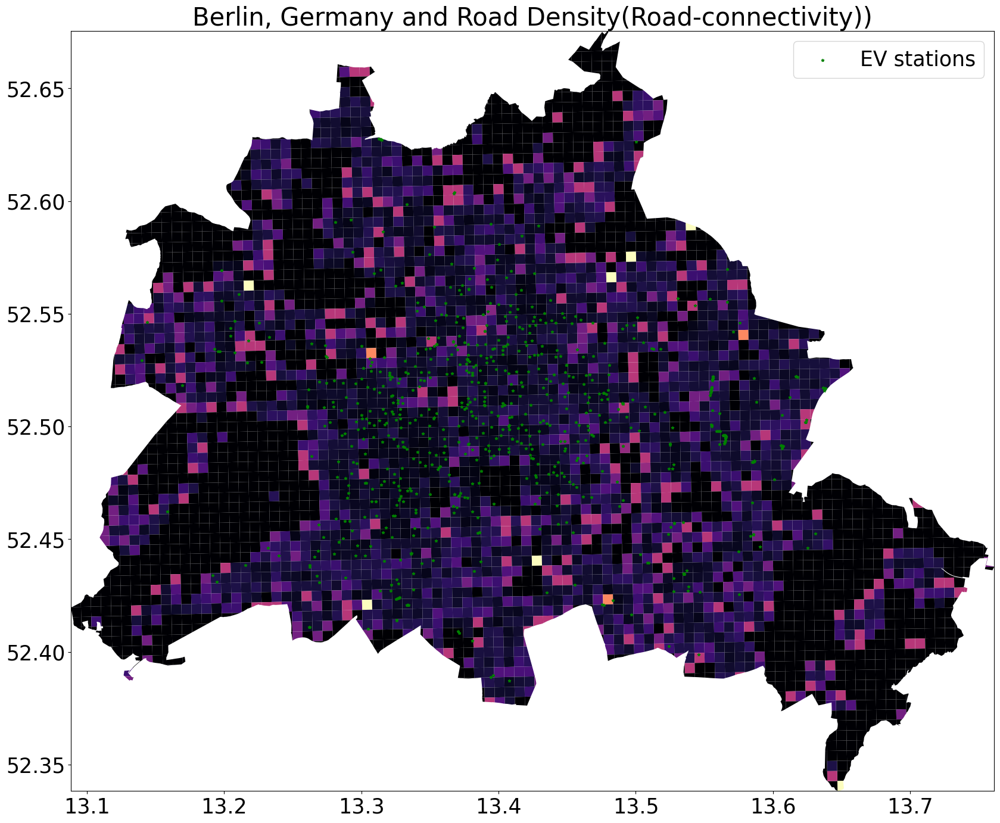

In [66]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

#nodes
fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'density', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and Road Density(Road-connectivity))')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

##### Parking

In [166]:
parking = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "parking"},
)
parking.head()
parking.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-parking.csv")

<Axes: >

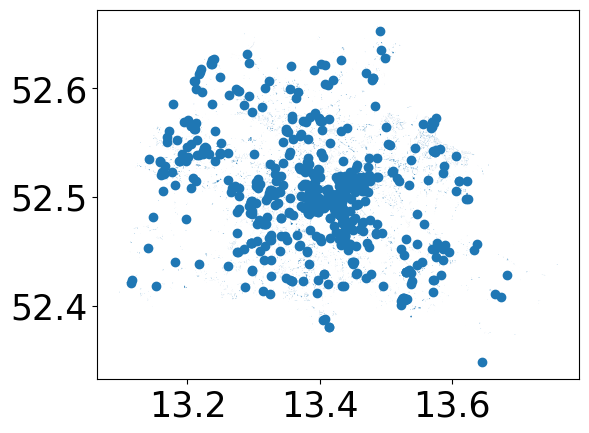

In [69]:
#parking spaces in the city
parking.plot()

In [76]:
#find parking spaces counts in the grid and their types
masks_parking = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = parking.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_parking.append(pip_mask)

100%|██████████| 3891/3891 [00:01<00:00, 2444.66it/s]


In [93]:
parking[masks_parking[1032]].shape[0]

5

In [94]:
#parking space counts and types to the dataframe
parking_count = []
parking_types = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    parking_count.append(parking[masks_parking[i]].shape[0])
    parking_types.append(parking[masks_parking[i]].parking.value_counts().to_dict())

100%|██████████| 3891/3891 [00:05<00:00, 706.46it/s]


In [102]:
berlin_polyframe_lat_long_new['parking_count'] = parking_count
berlin_polyframe_lat_long_new['parking_types'] = parking_types

/tmp/ipykernel_6216/874256832.py:12: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


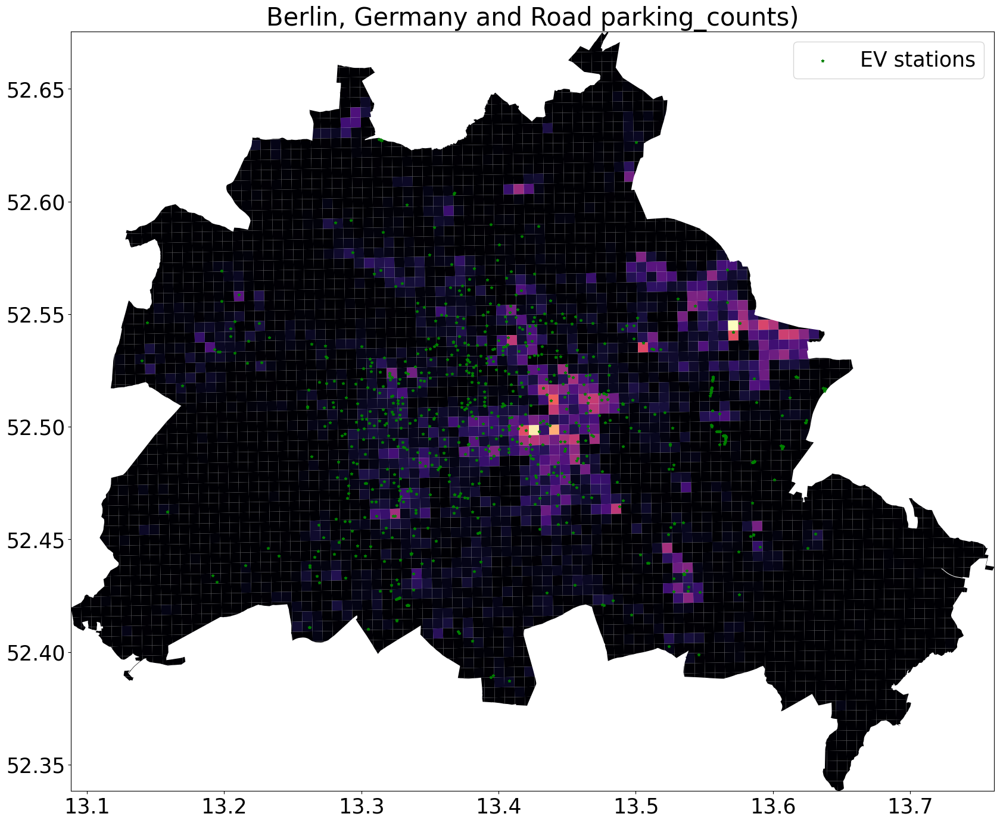

In [105]:
#relation between EV stations and parking spaces

plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'parking_count', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and Road parking_counts)')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

In [118]:
#realation between EV stations and parking types
berlin_polyframe_lat_long_new[berlin_polyframe_lat_long_new['EV_stations_counts'] != 0].parking_types.value_counts()

#TO DO: PlOT the parking types with EV stations


parking_types
{}                                                                                  42
{'surface': 1}                                                                      27
{'surface': 2}                                                                      21
{'surface': 3}                                                                      17
{'street_side': 1}                                                                   7
                                                                                    ..
{'underground': 5, 'surface': 2, 'street_side': 2, 'lane': 1}                        1
{'surface': 7, 'street_side': 6, 'underground': 1}                                   1
{'surface': 3, 'street_side': 3, 'underground': 2, 'multi-storey': 1, 'lane': 1}     1
{'street_side': 11, 'surface': 2}                                                    1
{'street_side': 15, 'surface': 1}                                                    1
Name: count, Length: 309, dty

##### Resturants

In [20]:
restaurant = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "restaurant"},
)
restaurant.head()
# restaurant.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-restaurant.csv")

addr:city addr:country addr:postcode       addr:street  \
element_type osmid                                                             
node         26735749    Berlin           DE         10623   Knesebeckstraße   
             26735759    Berlin           DE         10623        Kantstraße   
             26735763    Berlin           DE         10625  Pestalozzistraße   
             29997724    Berlin           DE         14057   Neue Kantstraße   
             30020303    Berlin           DE         10961   Zossener Straße   

                          addr:suburb     amenity        cuisine  \
element_type osmid                                                 
node         26735749  Charlottenburg  restaurant  italian;pizza   
             26735759  Charlottenburg  restaurant          asian   
             26735763  Charlottenburg  restaurant     vietnamese   
             29997724  Charlottenburg  restaurant        italian   
             30020303       Kreuzberg  restaurant        tibetan   

                                     email        name  \
element_type osmid                                       
node         26735749  aida-camillo@web.de        Aida   
             26735759                  NaN  Madame Ngo   
             26735763                  NaN  Thanh Long   
             29997724                  NaN  La Pergola   
             30020303                  NaN  Tibet Haus   

                                                           opening_hours  ...  \
element_type osmid                                                        ...   
node         26735749                  Mo-Sa 11:30-21:00; Su 15:00-21:00  ...   
             26735759  Mo-Sa 12:00-17:00,18:00-22:30; Su 12:00-17:00,...  ...   
             26735763                                                NaN  ...   
             29997724                                  Mo-Su 11:00-00:00  ...   
             30020303                                        12:00-24:00  ...   

                      building:part roof:orientation seamark:hulk:category  \
element_type osmid                                                           
node         26735749           NaN              NaN                   NaN   
             26735759           NaN              NaN                   NaN   
             26735763           NaN              NaN                   NaN   
             29997724           NaN              NaN                   NaN   
             30020303           NaN              NaN                   NaN   

                      seamark:type building:material building:start_date room  \
element_type osmid                                                              
node         26735749          NaN               NaN                 NaN  NaN   
             26735759          NaN               NaN                 NaN  NaN   
             26735763          NaN               NaN                 NaN  NaN   
             29997724          NaN               NaN                 NaN  NaN   
             30020303          NaN               NaN                 NaN  NaN   

                      landuse website:en ways  
element_type osmid                             
node         26735749     NaN        NaN  NaN  
             26735759     NaN        NaN  NaN  
             26735763     NaN        NaN  NaN  
             29997724     NaN        NaN  NaN  
             30020303     NaN        NaN  NaN  

[5 rows x 334 columns]

(13.054704205, 13.794801695, 52.32138160499999, 52.692371894999994)

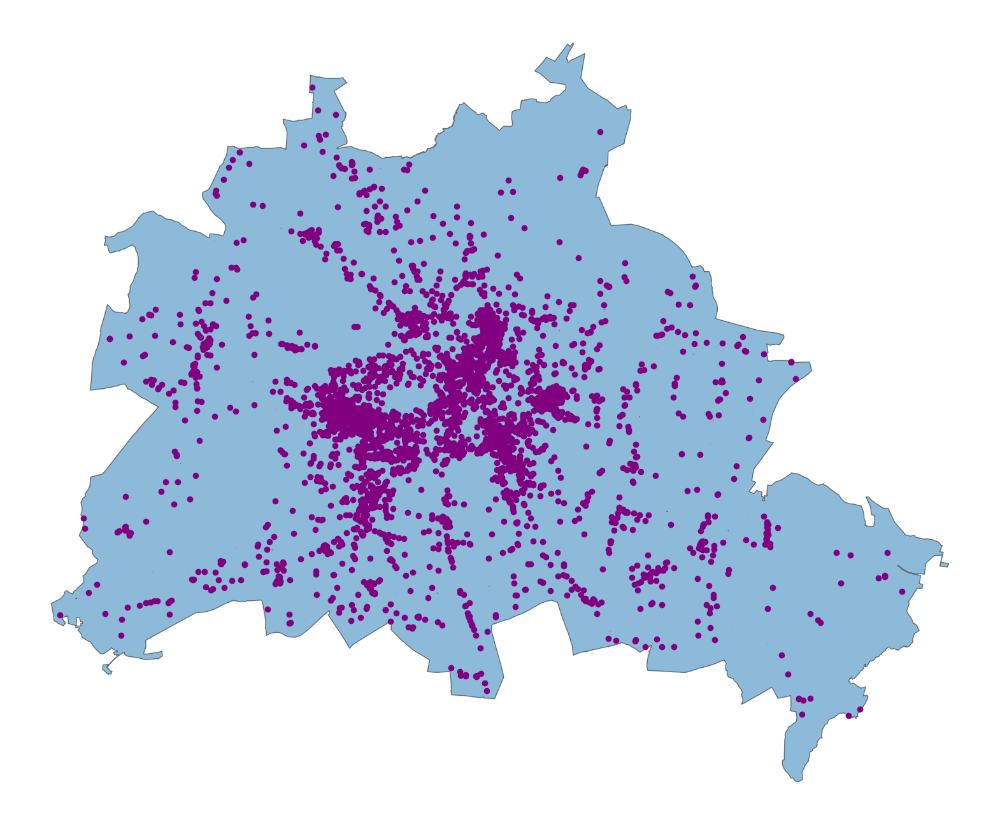

In [23]:
fig, ax = plt.subplots(figsize=(20,20))
ox.project_gdf(city, to_latlong=True).plot(ax =ax, alpha=0.5, edgecolor='k')
restaurant.plot(ax=ax, legend=False, color='purple')
plt.axis('off')

In [126]:
list(restaurant.columns)

['addr:city',
 'addr:country',
 'addr:postcode',
 'addr:street',
 'addr:suburb',
 'amenity',
 'cuisine',
 'email',
 'name',
 'opening_hours',
 'outdoor_seating',
 'phone',
 'toilets:wheelchair',
 'website',
 'wheelchair',
 'geometry',
 'addr:housenumber',
 'contact:website',
 'opening_hours:kitchen',
 'website:menu',
 'opening_hours:covid19',
 'wheelchair:description',
 'contact:facebook',
 'contact:phone',
 'level',
 'note',
 'diet:vegan',
 'indoor_seating',
 'diet:vegetarian',
 'smoking',
 'addr:place',
 'internet_access',
 'check_date:opening_hours',
 'fax',
 'smoking:outside',
 'brand',
 'brand:wikidata',
 'brand:wikipedia',
 'operator',
 'contact:email',
 'contact:fax',
 'entrance',
 'image',
 'wikidata',
 'wikimedia_commons',
 'wikipedia',
 'payment:mastercard',
 'payment:visa',
 'name:en',
 'check_date',
 'lunch:specials',
 'internet_access:fee',
 'takeaway',
 'opening_hours:signed',
 'payment:credit_cards',
 'payment:debit_cards',
 'lunch',
 'self_service',
 'capacity',
 'conta

In [130]:
#find resturants counts in the grid and their types
masks_restaurant = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = restaurant.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_restaurant.append(pip_mask)



100%|██████████| 3891/3891 [00:00<00:00, 10859.13it/s]


In [144]:
#resturant counts and capacity to the dataframe
restaurant_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    restaurant_count.append(restaurant[masks_restaurant[i]].shape[0])

100%|██████████| 3891/3891 [00:03<00:00, 1259.16it/s]


In [145]:
berlin_polyframe_lat_long_new['restaurant_count'] = restaurant_count

/tmp/ipykernel_6216/3766938667.py:9: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(['EV stations'])


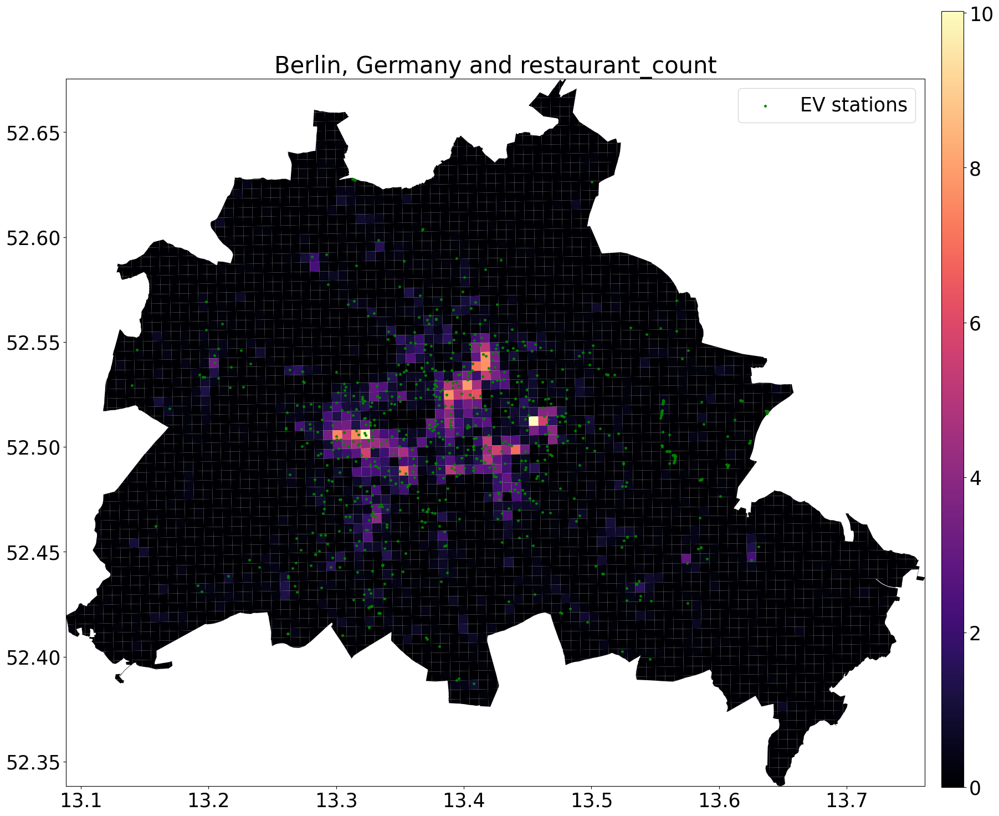

In [147]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'restaurant_count', legend=False, cmap='magma')
# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')
# add legend
plt.legend(['EV stations'])
plt.title(f'{PLACE_NAME} and restaurant_count')
cbax = fig.add_axes([0.915, 0.175, 0.02, 0.7])

sm = plt.cm.ScalarMappable(cmap='magma', \
                          norm = plt.Normalize(vmin=min(berlin_polyframe_lat_long_new.population), vmax=max(berlin_polyframe_lat_long_new.population)))
sm._A = []
# draw colormap into cbax
fig.colorbar(sm, cax=cbax, format="%d")
ax.set_xlim(west, east)
ax.set_ylim(south, north)
# ax.axis('off')30
plt.show()

##### library

In [169]:
#relation between EV stations and library
library = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "library"},
)
library.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-library.csv")
library.head()

addr:city addr:country addr:housenumber addr:postcode  \
element_type osmid                                                             
node         29071031     Berlin           DE               33         10559   
             60848456     Berlin           DE               14         10369   
             89275152     Berlin           DE            30-36         10178   
             203557001    Berlin           DE                4         12681   
             256922190    Berlin           DE               18         13627   

                                addr:street          addr:suburb  amenity  \
element_type osmid                                                          
node         29071031    Perleberger Straße               Moabit  library   
             60848456   Anton-Saefkow-Platz                  NaN  library   
             89275152         Breite Straße                Mitte  library   
             203557001  Helene-Weigel-Platz              Marzahn  library   
             256922190             Halemweg  Charlottenburg-Nord  library   

                                                             description  \
element_type osmid                                                         
node         29071031   Mo.-Fr. 11.00 - 19.30 Uhr, Sa. 10.00 - 14.00 Uhr   
             60848456                                                NaN   
             89275152                                                NaN   
             203557001                                               NaN   
             256922190                          WLAN frei für 30 Minuten   

                                                     name  \
element_type osmid                                          
node         29071031             Bruno-Lösche-Bibliothek   
             60848456            Anton-Saefkow-Bibliothek   
             89275152            Berliner Stadtbibliothek   
             203557001  Stadtteilbibliothek Erich Weinert   
             256922190       Stadtteilbibliothek Halemweg   

                                                            opening_hours  \
element_type osmid                                                          
node         29071031                   Mo-Fr 10:00-19:30; Sa 10:00-14:00   
             60848456   Mo-We 13:00-19:00; Th,Fr 09:00-18:00; Sa 09:00...   
             89275152                   Mo-Fr 10:00-21:00; Sa 10:00-19:00   
             203557001   Mo,Tu,Th,Fr 11:00-18:00;We 09:00-13:00;Su,PH off   
             256922190                                                NaN   

                        ... ways architect:wikidata name:es name:he name:ja  \
element_type osmid      ...                                                   
node         29071031   ...  NaN                NaN     NaN     NaN     NaN   
             60848456   ...  NaN                NaN     NaN     NaN     NaN   
             89275152   ...  NaN                NaN     NaN     NaN     NaN   
             203557001  ...  NaN                NaN     NaN     NaN     NaN   
             256922190  ...  NaN                NaN     NaN     NaN     NaN   

                       name:ko name:pl name:tr name:zh type  
element_type osmid                                           
node         29071031      NaN     NaN     NaN     NaN  NaN  
             60848456      NaN     NaN     NaN     NaN  NaN  
             89275152      NaN     NaN     NaN     NaN  NaN  
             203557001     NaN     NaN     NaN     NaN  NaN  
             256922190     NaN     NaN     NaN     NaN  NaN  

[5 rows x 124 columns]

<Axes: >

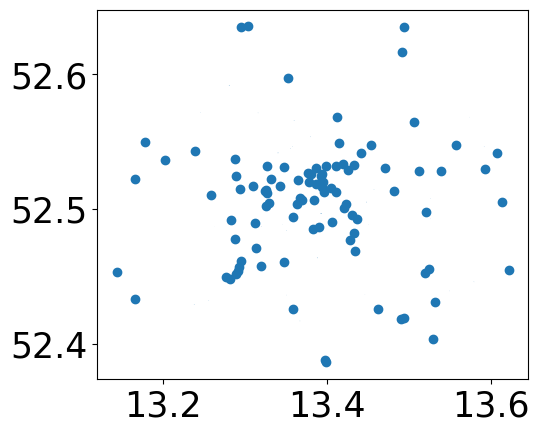

In [149]:
library.plot()

In [150]:
list(library.columns)

['addr:city',
 'addr:country',
 'addr:housenumber',
 'addr:postcode',
 'addr:street',
 'addr:suburb',
 'amenity',
 'description',
 'name',
 'opening_hours',
 'ref:isil',
 'toilets:wheelchair',
 'website',
 'wheelchair',
 'wheelchair:description',
 'wikidata',
 'geometry',
 'contact:phone',
 'check_date:opening_hours',
 'contact:website',
 'internet_access',
 'internet_access:fee',
 'internet_access:operator',
 'wikipedia',
 'addr:housename',
 'contact:email',
 'note',
 'operator',
 'wheelchair:description:de',
 'phone',
 'name:en',
 'ref',
 'email',
 'changing_table',
 'kids_area:indoor',
 'toilets',
 'toilets:access',
 'level',
 'alt_name',
 'opening_hours:covid19',
 'access',
 'entrance',
 'source',
 'fax',
 'service:copy',
 'addr:place',
 'layer',
 'name:etymology:wikidata',
 'contact:fax',
 'air_conditioning',
 'operator:type',
 'operator:wikidata',
 'operator:wikipedia',
 'check_date',
 'fixme',
 'old_name',
 'books:language:de',
 'books:language:en',
 'books:language:es',
 'books

In [151]:
# find library counts in the grid
masks_library = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = library.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_library.append(pip_mask)

#library counts to the dataframe
library_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    library_count.append(library[masks_library[i]].shape[0])

berlin_polyframe_lat_long_new['library_count'] = library_count

100%|██████████| 3891/3891 [00:02<00:00, 1698.42it/s]


##### University

In [180]:
university = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "university"},
)
university.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-university.csv")
university.head()

access barrier  \
element_type osmid                       
node         278540049     NaN     NaN   
             516359399     NaN     NaN   
             892568035     NaN     NaN   
             1425160484    NaN     NaN   
             1425160485    NaN     NaN   

                                                                      name  \
element_type osmid                                                           
node         278540049   Berliner Hochschule für Technik - Forum Seestraße   
             516359399                                      bbw Hochschule   
             892568035                                       Hertie School   
             1425160484                                FB Veterinärmedizin   
             1425160485            FB Geschichts- und Kulturwissenschaften   

                                          geometry addr:city addr:country  \
element_type osmid                                                          
node         278540049   POINT (13.35959 52.55372)    Berlin           DE   
             516359399   POINT (13.31499 52.51161)    Berlin           DE   
             892568035   POINT (13.38927 52.51285)    Berlin           DE   
             1425160484  POINT (13.29394 52.46095)    Berlin           DE   
             1425160485  POINT (13.29379 52.46161)    Berlin           DE   

                        addr:housenumber addr:postcode      addr:street  \
element_type osmid                                                        
node         278540049                64         13347        Seestraße   
             516359399             11-13         10625    Leibnizstraße   
             892568035               180         10117  Friedrichstraße   
             1425160484               20         14195      Koserstraße   
             1425160485               20         14195      Koserstraße   

                            addr:suburb  ... name:cs building:architecture  \
element_type osmid                       ...                                 
node         278540049          Wedding  ...     NaN                   NaN   
             516359399   Charlottenburg  ...     NaN                   NaN   
             892568035            Mitte  ...     NaN                   NaN   
             1425160484          Dahlem  ...     NaN                   NaN   
             1425160485          Dahlem  ...     NaN                   NaN   

                        building:cladding building:facade:colour branch  ref  \
element_type osmid                                                             
node         278540049                NaN                    NaN    NaN  NaN   
             516359399                NaN                    NaN    NaN  NaN   
             892568035                NaN                    NaN    NaN  NaN   
             1425160484               NaN                    NaN    NaN  NaN   
             1425160485               NaN                    NaN    NaN  NaN   

                        campus ways name:etymology:wikidata lda:criteria  
element_type osmid                                                        
node         278540049     NaN  NaN                     NaN          NaN  
             516359399     NaN  NaN                     NaN          NaN  
             892568035     NaN  NaN                     NaN          NaN  
             1425160484    NaN  NaN                     NaN          NaN  
             1425160485    NaN  NaN                     NaN          NaN  

[5 rows x 83 columns]

<Axes: >

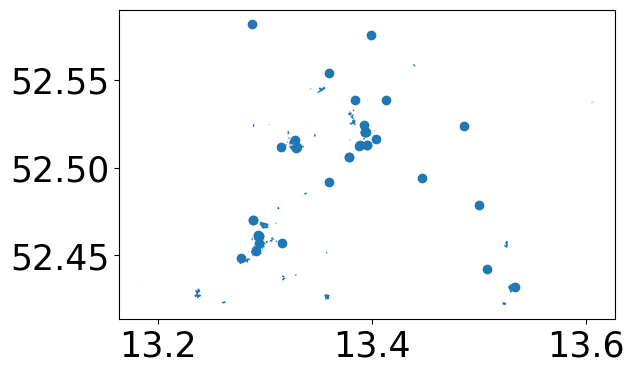

In [204]:
university.plot()

In [181]:
# find university counts in the grid
masks_university = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = university.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_university.append(pip_mask)

#university counts to the dataframe
university_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    university_count.append(university[masks_university[i]].shape[0])

berlin_polyframe_lat_long_new['university_count'] = university_count


100%|██████████| 3891/3891 [00:02<00:00, 1844.75it/s]


##### School

In [175]:
school = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "school"},
)
school.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-school.csv")
school.head()

barrier                   geometry addr:city  \
element_type osmid                                                    
node         237838613     NaN  POINT (13.33846 52.47997)    Berlin   
             256912446     NaN  POINT (13.28804 52.53944)    Berlin   
             256913234     NaN  POINT (13.24163 52.52114)    Berlin   
             256913872     NaN  POINT (13.28833 52.53766)    Berlin   
             268915152     NaN  POINT (13.43073 52.55538)       NaN   

                       addr:country addr:housenumber addr:postcode  \
element_type osmid                                                   
node         237838613           DE                8         10825   
             256912446           DE            34-42         13627   
             256913234           DE                1         14053   
             256913872           DE               22         13627   
             268915152          NaN              NaN           NaN   

                                     addr:street          addr:suburb amenity  \
element_type osmid                                                              
node         237838613               Mettestraße           Schöneberg  school   
             256912446                  Halemweg  Charlottenburg-Nord  school   
             256913234  Prinz-Friedrich-Karl-Weg              Westend  school   
             256913872                  Halemweg              Westend  school   
             268915152                       NaN                  NaN  school   

                                                           email  ... year  \
element_type osmid                                                ...        
node         237838613  sekretariat@rueckert-gymnasium-berlin.de  ...  NaN   
             256912446        Erwin-von-Witzleben-GS@t-online.de  ...  NaN   
             256913234                                       NaN  ...  NaN   
             256913872                    post@anna-freud-osz.de  ...  NaN   
             268915152                                       NaN  ...  NaN   

                       opening_date language:fr temporary old_name:1860  \
element_type osmid                                                        
node         237838613          NaN         NaN       NaN           NaN   
             256912446          NaN         NaN       NaN           NaN   
             256913234          NaN         NaN       NaN           NaN   
             256913872          NaN         NaN       NaN           NaN   
             268915152          NaN         NaN       NaN           NaN   

                       old_name:1942 old_name:1960 old_name:1993-2012  \
element_type osmid                                                      
node         237838613           NaN           NaN                NaN   
             256912446           NaN           NaN                NaN   
             256913234           NaN           NaN                NaN   
             256913872           NaN           NaN                NaN   
             268915152           NaN           NaN                NaN   

                       old_name:2 ways  
element_type osmid                      
node         237838613        NaN  NaN  
             256912446        NaN  NaN  
             256913234        NaN  NaN  
             256913872        NaN  NaN  
             268915152        NaN  NaN  

[5 rows x 140 columns]

<Axes: >

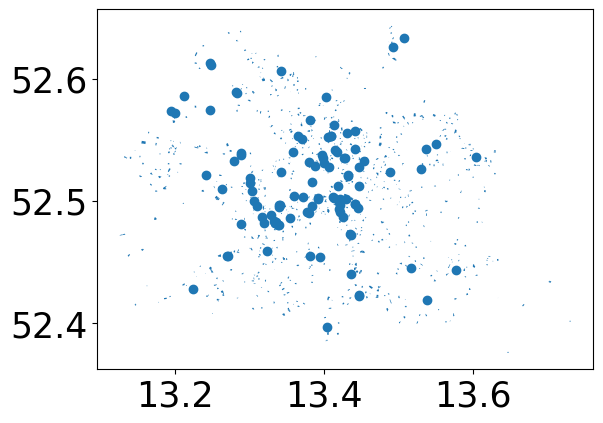

In [177]:
school.plot()

In [176]:
# find school counts in the grid
masks_school = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = school.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_school.append(pip_mask)

#school counts to the dataframe
school_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    school_count.append(school[masks_school[i]].shape[0])

berlin_polyframe_lat_long_new['school_count'] = school_count


100%|██████████| 3891/3891 [00:02<00:00, 1657.48it/s]


##### Leisure = park

In [15]:
park = ox.geometries_from_place(
    PLACE_NAME,
    {"leisure": "park"},
)

# park.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-park.csv")
park.head()


geometry  \
element_type osmid                                                            
node         9844946880                           POINT (13.38276 52.54624)   
             10733144583                          POINT (13.44217 52.44578)   
             10959526674                          POINT (13.37140 52.51846)   
way          4413796      POLYGON ((13.31144 52.49382, 13.31153 52.49381...   
             4440110      POLYGON ((13.39299 52.39889, 13.39298 52.39897...   

                         barrier opening_hours access  lit  \
element_type osmid                                           
node         9844946880      NaN           NaN    NaN  NaN   
             10733144583     NaN           NaN    NaN  NaN   
             10959526674     NaN          24/7    NaN  NaN   
way          4413796         NaN          24/7    NaN  NaN   
             4440110         NaN           NaN    NaN  NaN   

                                                               name tourism  \
element_type osmid                                                            
node         9844946880                                  Liegewiese     NaN   
             10733144583                          Britzer Baumblüte     NaN   
             10959526674  Ehemalige Krolloper, heute Skulpturenpark     NaN   
way          4413796                                    Preußenpark     NaN   
             4440110                                            NaN     NaN   

                                                          website wheelchair  \
element_type osmid                                                             
node         9844946880                                       NaN        NaN   
             10733144583         http://www.britzer-baumbluete.de        NaN   
             10959526674  https://de.wikipedia.org/wiki/Krolloper        NaN   
way          4413796                                          NaN        NaN   
             4440110                                          NaN        NaN   

                         bicycle  ... landcover abandoned:amenity ref:bldam  \
element_type osmid                ...                                         
node         9844946880      NaN  ...       NaN               NaN       NaN   
             10733144583     NaN  ...       NaN               NaN       NaN   
             10959526674     NaN  ...       NaN               NaN       NaN   
way          4413796         NaN  ...       NaN               NaN       NaN   
             4440110         NaN  ...       NaN               NaN       NaN   

                         note:contact:website website:de whatsapp ways type  \
element_type osmid                                                            
node         9844946880                   NaN        NaN      NaN  NaN  NaN   
             10733144583                  NaN        NaN      NaN  NaN  NaN   
             10959526674                  NaN        NaN      NaN  NaN  NaN   
way          4413796                      NaN        NaN      NaN  NaN  NaN   
             4440110                      NaN        NaN      NaN  NaN  NaN   

                         name:de name:ko  
element_type osmid                        
node         9844946880      NaN     NaN  
             10733144583     NaN     NaN  
             10959526674     NaN     NaN  
way          4413796         NaN     NaN  
             4440110         NaN     NaN  

[5 rows x 126 columns]

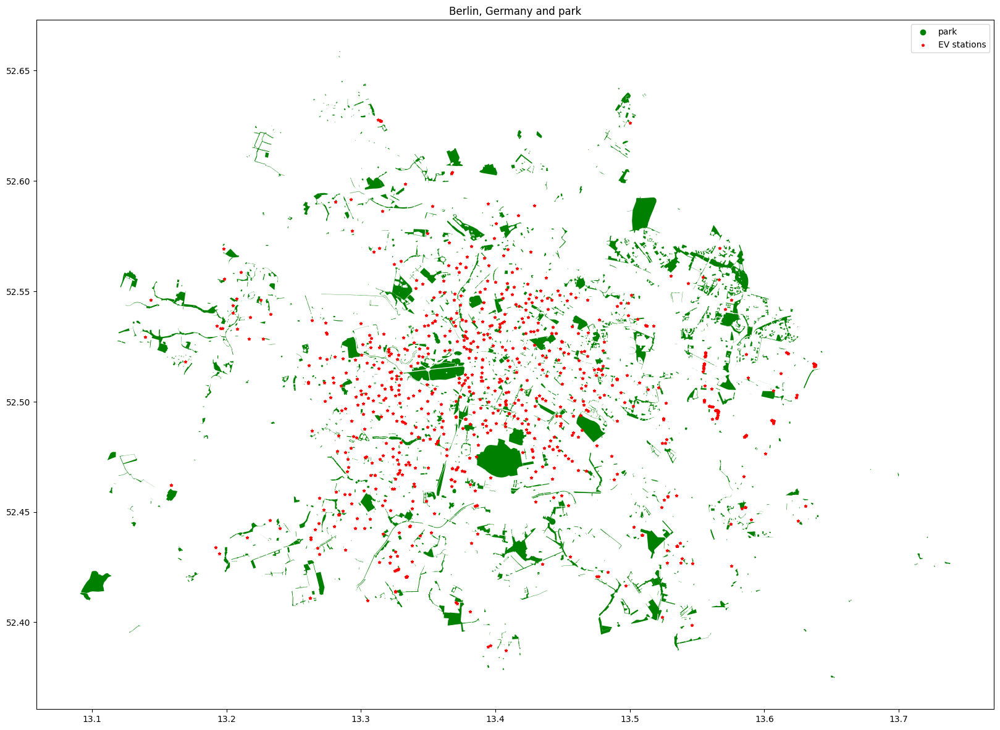

In [19]:
#plot the park data 

# plt.rcParams.update({'font.size':20})
fig, ax = plt.subplots(figsize=(20,20))
park.plot(ax=ax, legend=False, color='green')
plt.title(f'{PLACE_NAME} and park')

# add EV stations
EV_stations.plot(ax=ax, color='red', markersize=10, marker='*', label='EV stations')
# add legend
plt.legend(['park', 'EV stations'])

In [184]:
# find park counts in the grid
masks_park = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = park.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_park.append(pip_mask)

#park counts to the dataframe
park_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    park_count.append(park[masks_park[i]].shape[0])

berlin_polyframe_lat_long_new['park_count'] = park_count

100%|██████████| 3891/3891 [00:02<00:00, 1645.09it/s]


##### Leisure = Cinema

In [153]:
cinema = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "cinema"},
)
cinema.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-cinema.csv")
cinema.head()

addr:city addr:country addr:housenumber addr:postcode  \
element_type osmid                                                             
node         29040741     Berlin           DE               35         10557   
             79615774        NaN          NaN              NaN           NaN   
             101186634    Berlin           DE          176-178         12681   
             251559871    Berlin           DE              107         10245   
             256754256    Berlin           DE               30         10178   

                                  addr:street     addr:suburb amenity  \
element_type osmid                                                      
node         29040741          Lehrter Straße          Moabit  cinema   
             79615774                     NaN             NaN  cinema   
             101186634        Märkische Allee             NaN  cinema   
             251559871      Boxhagener Straße  Friedrichshain  cinema   
             256754256  Rosa-Luxemburg-Straße           Mitte  cinema   

                                                        name            phone  \
element_type osmid                                                              
node         29040741   Filmrauschpalast in der Kulturfabrik   +49 30 3844344   
             79615774                               CineStar              NaN   
             101186634                       UCI Am Eastgate  +49 30 93030260   
             251559871                          Kino Intimes              NaN   
             256754256                          Kino Babylon              NaN   

                       toilets:wheelchair  ... roof:colour operator:wikidata  \
element_type osmid                         ...                                 
node         29040741                  no  ...         NaN               NaN   
             79615774                 yes  ...         NaN               NaN   
             101186634                yes  ...         NaN               NaN   
             251559871                 no  ...         NaN               NaN   
             256754256                NaN  ...         NaN               NaN   

                       contact:fax roof:levels air_conditioning  \
element_type osmid                                                
node         29040741          NaN         NaN              NaN   
             79615774          NaN         NaN              NaN   
             101186634         NaN         NaN              NaN   
             251559871         NaN         NaN              NaN   
             256754256         NaN         NaN              NaN   

                       contact:google_plus  fax lda:criteria name:de name:en  
element_type osmid                                                            
node         29040741                  NaN  NaN          NaN     NaN     NaN  
             79615774                  NaN  NaN          NaN     NaN     NaN  
             101186634                 NaN  NaN          NaN     NaN     NaN  
             251559871                 NaN  NaN          NaN     NaN     NaN  
             256754256                 NaN  NaN          NaN     NaN     NaN  

[5 rows x 86 columns]

<Axes: >

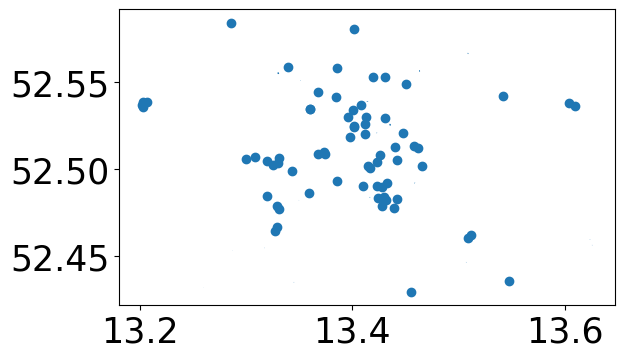

In [154]:
cinema.plot()

In [ ]:
# find cinema counts in the grid
masks_cinema = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = cinema.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_cinema.append(pip_mask)

#cinema counts to the dataframe
cinema_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    cinema_count.append(cinema[masks_cinema[i]].shape[0])

##### Townhall

In [170]:
townhall = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "townhall"},
)
townhall.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-townhall.csv")
townhall.head()

amenity                  name wheelchair  \
element_type osmid                                                   
node         361001240   townhall  Bürgeramt Heerstraße        yes   
             667712670   townhall           Bürgeramt 3        yes   
             1357750757  townhall            Bundeshaus         no   
             1498303207  townhall             Bürgeramt        yes   
             1776512892  townhall           Bürgeramt 2        NaN   

                                          geometry addr:city addr:country  \
element_type osmid                                                          
node         361001240   POINT (13.26794 52.50944)    Berlin           DE   
             667712670   POINT (13.46152 52.51556)    Berlin           DE   
             1357750757  POINT (13.33116 52.49809)    Berlin           DE   
             1498303207  POINT (13.55840 52.50496)    Berlin           DE   
             1776512892  POINT (13.44765 52.49843)    Berlin           DE   

                        addr:housenumber addr:postcode          addr:street  \
element_type osmid                                                            
node         361001240             12-14         14052           Heerstraße   
             667712670             35/37         10247    Frankfurter Allee   
             1357750757          216-218         10719          Bundesallee   
             1498303207                3         12683  Elsterwerdaer Platz   
             1776512892              27a         10997   Schlesische Straße   

                            addr:suburb  ... ways name:de name:en type  \
element_type osmid                       ...                             
node         361001240          Westend  ...  NaN     NaN     NaN  NaN   
             667712670   Friedrichshain  ...  NaN     NaN     NaN  NaN   
             1357750757     Wilmersdorf  ...  NaN     NaN     NaN  NaN   
             1498303207        Biesdorf  ...  NaN     NaN     NaN  NaN   
             1776512892       Kreuzberg  ...  NaN     NaN     NaN  NaN   

                        architect heritage:website architect:wikidata  ele  \
element_type osmid                                                           
node         361001240        NaN              NaN                NaN  NaN   
             667712670        NaN              NaN                NaN  NaN   
             1357750757       NaN              NaN                NaN  NaN   
             1498303207       NaN              NaN                NaN  NaN   
             1776512892       NaN              NaN                NaN  NaN   

                        name:ru wikimedia_commons  
element_type osmid                                 
node         361001240      NaN               NaN  
             667712670      NaN               NaN  
             1357750757     NaN               NaN  
             1498303207     NaN               NaN  
             1776512892     NaN               NaN  

[5 rows x 66 columns]

<Axes: >

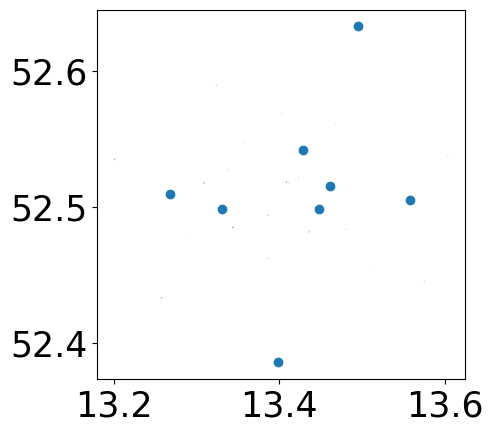

In [156]:
townhall.plot()

In [205]:
# find townhall counts in the grid
masks_townhall = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = townhall.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_townhall.append(pip_mask)

#townhall counts to the dataframe
townhall_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    townhall_count.append(townhall[masks_townhall[i]].shape[0])

berlin_polyframe_lat_long_new['townhall_count'] = townhall_count


100%|██████████| 3891/3891 [00:02<00:00, 1784.20it/s]


##### Community_centre

In [172]:
Community_centre = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "community_centre"},
)
Community_centre.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-Community_centre.csv")
Community_centre.head()

geometry addr:city addr:country  \
element_type osmid                                                         
node         266630320  POINT (13.61206 52.51314)    Berlin           DE   
             268915262  POINT (13.34154 52.53100)    Berlin           DE   
             268915306  POINT (13.41931 52.48888)    Berlin           DE   
             268915454  POINT (13.34898 52.52389)    Berlin           DE   
             268917395  POINT (13.30968 52.50440)    Berlin          NaN   

                       addr:housenumber addr:postcode             addr:street  \
element_type osmid                                                              
node         266630320               91         12623          Hönower Straße   
             268915262               22         10551  Wilhelmshavener Straße   
             268915306                5         10967              Jahnstraße   
             268915454                4         10557             Kirchstraße   
             268917395            59/60         10629           Niebuhrstraße   

                       addr:suburb           amenity                     name  \
element_type osmid                                                              
node         266630320   Mahlsdorf  community_centre     Buergeramt Mahlsdorf   
             268915262      Moabit  community_centre              Karame e.V.   
             268915306   Kreuzberg  community_centre                Biberzahn   
             268915454      Moabit  community_centre        K3 Kiez-Kids-Klub   
             268917395         NaN  community_centre  Schwulenberatung Berlin   

                                                                 operator  \
element_type osmid                                                          
node         266630320                                                NaN   
             268915262                                                NaN   
             268915306  Kooperationsverbund Reinhardswald Grundschule ...   
             268915454                                Frecher Spatz e. V.   
             268917395                                                NaN   

                        ... name:ja proposed loc_name nohousenumber  \
element_type osmid      ...                                           
node         266630320  ...     NaN      NaN      NaN           NaN   
             268915262  ...     NaN      NaN      NaN           NaN   
             268915306  ...     NaN      NaN      NaN           NaN   
             268915454  ...     NaN      NaN      NaN           NaN   
             268917395  ...     NaN      NaN      NaN           NaN   

                       addr:district addr:state addr:subdistrict area ways  \
element_type osmid                                                           
node         266630320           NaN        NaN              NaN  NaN  NaN   
             268915262           NaN        NaN              NaN  NaN  NaN   
             268915306           NaN        NaN              NaN  NaN  NaN   
             268915454           NaN        NaN              NaN  NaN  NaN   
             268917395           NaN        NaN              NaN  NaN  NaN   

                       type  
element_type osmid           
node         266630320  NaN  
             268915262  NaN  
             268915306  NaN  
             268915454  NaN  
             268917395  NaN  

[5 rows x 201 columns]

In [173]:
# find Community_centre counts in the grid
masks_Community_centre = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = Community_centre.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_Community_centre.append(pip_mask)

#Community_centre counts to the dataframe
Community_centre_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    Community_centre_count.append(Community_centre[masks_Community_centre[i]].shape[0])

100%|██████████| 3891/3891 [00:02<00:00, 1502.30it/s]


In [174]:
berlin_polyframe_lat_long_new['Community_centre_count'] = Community_centre_count

##### Building = Geovenment 

In [206]:
government = ox.geometries_from_place(
    PLACE_NAME,
    {"building": "government"},
)

government.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-government_building.csv")
government.head()

geometry  \
element_type osmid                                                         
way          11351098  POLYGON ((13.37704 52.52049, 13.37706 52.52049...   
             11688785  POLYGON ((13.38039 52.50965, 13.38043 52.50966...   
             23463402  POLYGON ((13.31654 52.49168, 13.31663 52.49201...   
             24042259  POLYGON ((13.46366 52.48709, 13.46374 52.48704...   
             24055663  POLYGON ((13.31526 52.49220, 13.31525 52.49215...   

                      addr:city addr:country addr:housenumber addr:postcode  \
element_type osmid                                                            
way          11351098       NaN          NaN              NaN           NaN   
             11688785    Berlin           DE              3-4         10117   
             23463402       NaN          NaN              NaN           NaN   
             24042259       NaN          NaN              NaN           NaN   
             24055663       NaN          NaN              NaN           NaN   

                            addr:street addr:suburb surveillance wheelchair  \
element_type osmid                                                            
way          11351098               NaN         NaN          NaN        NaN   
             11688785  Leipziger Straße       Mitte          NaN        yes   
             23463402               NaN         NaN          NaN        NaN   
             24042259               NaN         NaN          NaN        NaN   
             24055663               NaN         NaN          NaN        yes   

                      source  ... name:is name:ko name:lt name:pt name:ro  \
element_type osmid            ...                                           
way          11351098    NaN  ...     NaN     NaN     NaN     NaN     NaN   
             11688785    NaN  ...     NaN     NaN     NaN     NaN     NaN   
             23463402    NaN  ...     NaN     NaN     NaN     NaN     NaN   
             24042259    NaN  ...     NaN     NaN     NaN     NaN     NaN   
             24055663    NaN  ...     NaN     NaN     NaN     NaN     NaN   

                      name:sk name:zh ref:vatin reservation toilets  
element_type osmid                                                   
way          11351098     NaN     NaN       NaN         NaN     NaN  
             11688785     NaN     NaN       NaN         NaN     NaN  
             23463402     NaN     NaN       NaN         NaN     NaN  
             24042259     NaN     NaN       NaN         NaN     NaN  
             24055663     NaN     NaN       NaN         NaN     NaN  

[5 rows x 137 columns]

<Axes: >

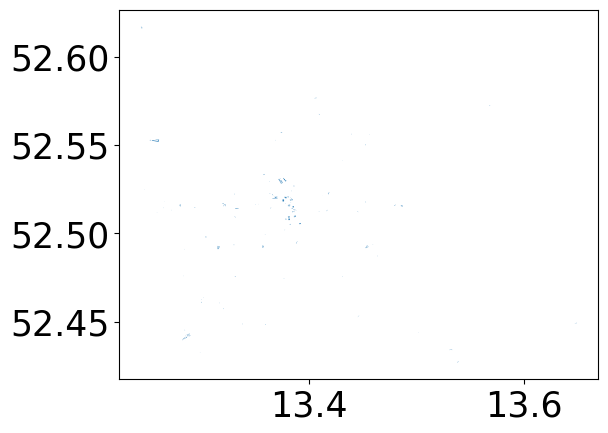

In [207]:
government.plot()

In [208]:
# find government counts in the grid
masks_government = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = government.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_government.append(pip_mask)

#government counts to the dataframe
government_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    government_count.append(government[masks_government[i]].shape[0])

berlin_polyframe_lat_long_new['government_count'] = government_count


100%|██████████| 3891/3891 [00:02<00:00, 1631.44it/s]


##### Building=civic 

In [209]:
civic = ox.geometries_from_place(
    PLACE_NAME,
    {"building": "civic"},
)

civic.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-civic_building.csv")
civic.head()

geometry  \
element_type osmid                                                         
way          5083117   POLYGON ((13.20134 52.53602, 13.20142 52.53603...   
             7997184   POLYGON ((13.45165 52.53020, 13.45153 52.53016...   
             7997192   POLYGON ((13.45363 52.52893, 13.45258 52.52854...   
             11687794  POLYGON ((13.34779 52.50112, 13.34797 52.50144...   
             12089675  POLYGON ((13.31547 52.57978, 13.31641 52.57948...   

                      addr:city addr:country addr:housenumber addr:postcode  \
element_type osmid                                                            
way          5083117        NaN          NaN              NaN           NaN   
             7997184        NaN          NaN              NaN           NaN   
             7997192     Berlin           DE               26         10407   
             11687794    Berlin          NaN               17         10787   
             12089675    Berlin          NaN          115-121         13403   

                             addr:street      addr:suburb wheelchair access  \
element_type osmid                                                            
way          5083117                 NaN              NaN        NaN    NaN   
             7997184                 NaN              NaN        yes    NaN   
             7997192   Paul-Heyse-Straße  Prenzlauer Berg        yes    NaN   
             11687794      An der Urania              NaN        yes    NaN   
             12089675       Eichborndamm      Borsigwalde        NaN    NaN   

                                               source  ... name:it  \
element_type osmid                                     ...           
way          5083117   Geoportal Berlin / Hausumringe  ...     NaN   
             7997184                              NaN  ...     NaN   
             7997192                              NaN  ...     NaN   
             11687794                             NaN  ...     NaN   
             12089675                             NaN  ...     NaN   

                      description:de ways type official_name not:historic  \
element_type osmid                                                          
way          5083117             NaN  NaN  NaN           NaN          NaN   
             7997184             NaN  NaN  NaN           NaN          NaN   
             7997192             NaN  NaN  NaN           NaN          NaN   
             11687794            NaN  NaN  NaN           NaN          NaN   
             12089675            NaN  NaN  NaN           NaN          NaN   

                      not:name blind:description:de name:prefix townhall:type  
element_type osmid                                                             
way          5083117       NaN                  NaN         NaN           NaN  
             7997184       NaN                  NaN         NaN           NaN  
             7997192       NaN                  NaN         NaN           NaN  
             11687794      NaN                  NaN         NaN           NaN  
             12089675      NaN                  NaN         NaN           NaN  

[5 rows x 139 columns]

<Axes: >

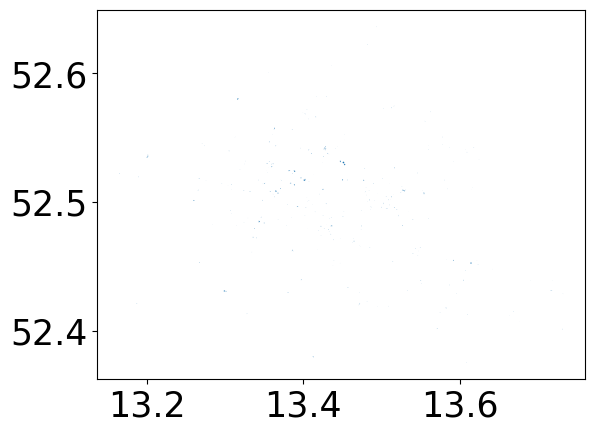

In [210]:
civic.plot()

In [211]:
# find civic counts in the grid
masks_civic = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = civic.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_civic.append(pip_mask)

#civic counts to the dataframe
civic_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    civic_count.append(civic[masks_civic[i]].shape[0])

berlin_polyframe_lat_long_new['civic_count'] = civic_count

100%|██████████| 3891/3891 [00:02<00:00, 1580.10it/s]


##### building=commercial

In [212]:
commercial = ox.geometries_from_place(
    PLACE_NAME,
    {"building": "commercial"},
)
commercial.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-commercial_building.csv")
commercial.head()


amenity brand brand:wikidata brand:wikipedia  \
element_type osmid                                                       
node         10539765825      NaN   NaN            NaN             NaN   
             10539796071      NaN   NaN            NaN             NaN   
             10723725005      NaN   NaN            NaN             NaN   
way          9857234          NaN   NaN            NaN             NaN   
             9857259      parking   NaN            NaN             NaN   

                         opening_hours wheelchair  \
element_type osmid                                  
node         10539765825           NaN        NaN   
             10539796071           NaN        NaN   
             10723725005           NaN        NaN   
way          9857234               NaN        NaN   
             9857259               NaN        NaN   

                                                                   geometry  \
element_type osmid                                                            
node         10539765825                          POINT (13.41350 52.53856)   
             10539796071                          POINT (13.41420 52.53888)   
             10723725005                          POINT (13.38496 52.47117)   
way          9857234      POLYGON ((13.29814 52.57965, 13.29737 52.57920...   
             9857259      POLYGON ((13.29493 52.57967, 13.29528 52.57924...   

                         addr:city addr:country addr:housenumber  ...  \
element_type osmid                                                ...   
node         10539765825       NaN          NaN              NaN  ...   
             10539796071       NaN          NaN              NaN  ...   
             10723725005       NaN          NaN              NaN  ...   
way          9857234        Berlin           DE              NaN  ...   
             9857259           NaN          NaN              NaN  ...   

                         source:toilets:wheelchair heritage:since roof trade  \
element_type osmid                                                             
node         10539765825                       NaN            NaN  NaN   NaN   
             10539796071                       NaN            NaN  NaN   NaN   
             10723725005                       NaN            NaN  NaN   NaN   
way          9857234                           NaN            NaN  NaN   NaN   
             9857259                           NaN            NaN  NaN   NaN   

                         type ways building:roof:shape building:parts  \
element_type osmid                                                      
node         10539765825  NaN  NaN                 NaN            NaN   
             10539796071  NaN  NaN                 NaN            NaN   
             10723725005  NaN  NaN                 NaN            NaN   
way          9857234      NaN  NaN                 NaN            NaN   
             9857259      NaN  NaN                 NaN            NaN   

                         loc_name construction:office  
element_type osmid                                     
node         10539765825      NaN                 NaN  
             10539796071      NaN                 NaN  
             10723725005      NaN                 NaN  
way          9857234          NaN                 NaN  
             9857259          NaN                 NaN  

[5 rows x 296 columns]

<Axes: >

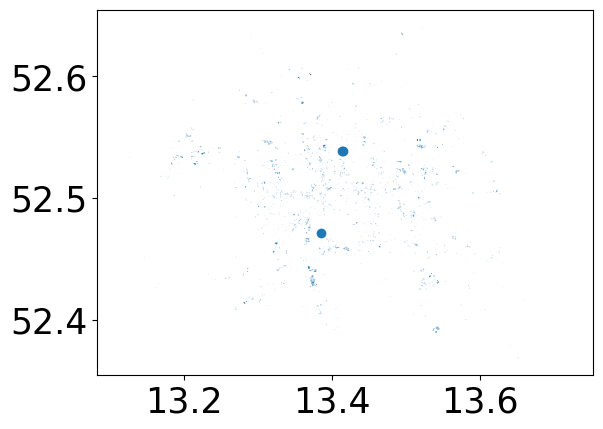

In [214]:
commercial.plot()

In [215]:
# find commercial counts in the grid
masks_commercial = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = commercial.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_commercial.append(pip_mask)

#commercial counts to the dataframe
commercial_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    commercial_count.append(commercial[masks_commercial[i]].shape[0])

berlin_polyframe_lat_long_new['commercial_count'] = commercial_count


100%|██████████| 3891/3891 [00:02<00:00, 1317.95it/s]


##### building = Retail stores

In [216]:
retail = ox.geometries_from_place(
    PLACE_NAME,
    {"building": "retail"},
)
retail.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-retail_building.csv")
retail.head()

addr:city addr:country addr:housenumber addr:postcode  \
element_type osmid                                                            
way          4703544     Berlin           DE              2-4         10551   
             9857335        NaN          NaN              NaN           NaN   
             10672229    Berlin           DE              NaN         13403   
             11076700    Berlin           DE              140         13405   
             11249452    Berlin           DE                1         13051   

                                  addr:street           addr:suburb source  \
element_type osmid                                                           
way          4703544           Arminiusstraße                Moabit    NaN   
             9857335                      NaN                   NaN    NaN   
             10672229  Auguste-Viktoria-Allee         Reinickendorf    NaN   
             11076700       Scharnweberstraße         Reinickendorf    NaN   
             11249452          Prerower Platz  Neu-Hohenschönhausen    NaN   

                                                                geometry  \
element_type osmid                                                         
way          4703544   POLYGON ((13.33907 52.52743, 13.33903 52.52741...   
             9857335   POLYGON ((13.29313 52.57966, 13.29338 52.57958...   
             10672229  POLYGON ((13.32837 52.57004, 13.32838 52.57007...   
             11076700  POLYGON ((13.32754 52.56323, 13.32756 52.56327...   
             11249452  POLYGON ((13.50654 52.56407, 13.50652 52.56407...   

                      access      amenity  ... sausage  \
element_type osmid                         ...           
way          4703544     NaN  marketplace  ...     NaN   
             9857335     NaN          NaN  ...     NaN   
             10672229    NaN          NaN  ...     NaN   
             11076700    NaN          NaN  ...     NaN   
             11249452    NaN          NaN  ...     NaN   

                      standup_paddleboard_rental ways note:opening_hours  \
element_type osmid                                                         
way          4703544                         NaN  NaN                NaN   
             9857335                         NaN  NaN                NaN   
             10672229                        NaN  NaN                NaN   
             11076700                        NaN  NaN                NaN   
             11249452                        NaN  NaN                NaN   

                      source:opening_hours name:ko name:es name:fr name:nl  \
element_type osmid                                                           
way          4703544                   NaN     NaN     NaN     NaN     NaN   
             9857335                   NaN     NaN     NaN     NaN     NaN   
             10672229                  NaN     NaN     NaN     NaN     NaN   
             11076700                  NaN     NaN     NaN     NaN     NaN   
             11249452                  NaN     NaN     NaN     NaN     NaN   

                      name:tr  
element_type osmid             
way          4703544      NaN  
             9857335      NaN  
             10672229     NaN  
             11076700     NaN  
             11249452     NaN  

[5 rows x 251 columns]

<Axes: >

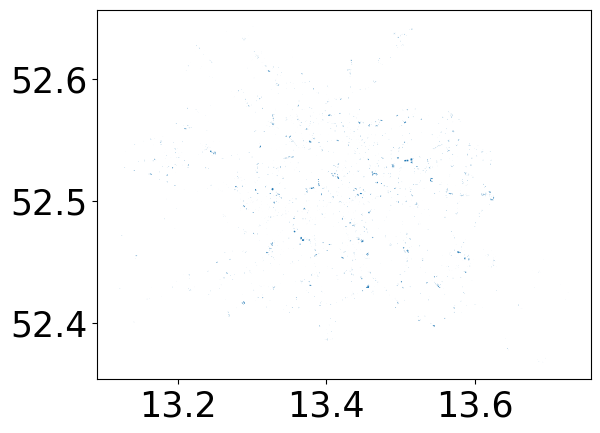

In [217]:
retail.plot()

In [218]:
# find retail counts in the grid
masks_retail = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = retail.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_retail.append(pip_mask)

#retail counts to the dataframe
retail_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    retail_count.append(retail[masks_retail[i]].shape[0])

berlin_polyframe_lat_long_new['retail_count'] = retail_count

100%|██████████| 3891/3891 [00:02<00:00, 1407.76it/s]


##### amenity=place_of_worship

In [220]:
place_of_worship = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "place_of_worship"},
)
place_of_worship.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-place_of_worship.csv")
place_of_worship.head()

amenity  \
element_type osmid                         
node         29040731   place_of_worship   
             29209127   place_of_worship   
             248702772  place_of_worship   
             289795838  place_of_worship   
             292201931  place_of_worship   

                                                         name   religion  \
element_type osmid                                                         
node         29040731                      Sultan Ahmed Camii     muslim   
             29209127                                     NaN  christian   
             248702772                  Martin-Luther-Kapelle  christian   
             289795838                            St. Wilhelm  christian   
             292201931  Stadtmission Gemeinde Friedrichshagen  christian   

                       wheelchair                   geometry denomination  \
element_type osmid                                                          
node         29040731         yes  POINT (13.35878 52.53478)          NaN   
             29209127     limited  POINT (13.39038 52.49518)          NaN   
             248702772        NaN  POINT (13.29662 52.60102)   protestant   
             289795838        NaN  POINT (13.19542 52.52251)     catholic   
             292201931        NaN  POINT (13.62357 52.44750)   protestant   

                       addr:city addr:country addr:housenumber addr:postcode  \
element_type osmid                                                             
node         29040731        NaN          NaN              NaN           NaN   
             29209127        NaN          NaN              NaN           NaN   
             248702772       NaN          NaN              NaN           NaN   
             289795838    Berlin           DE             9-11         13595   
             292201931    Berlin           DE              135         12587   

                        ... name:sr-Latn description:de name:et  \
element_type osmid      ...                                       
node         29040731   ...          NaN            NaN     NaN   
             29209127   ...          NaN            NaN     NaN   
             248702772  ...          NaN            NaN     NaN   
             289795838  ...          NaN            NaN     NaN   
             292201931  ...          NaN            NaN     NaN   

                       reconstruction_date layer location landuse name:signed  \
element_type osmid                                                              
node         29040731                  NaN   NaN      NaN     NaN         NaN   
             29209127                  NaN   NaN      NaN     NaN         NaN   
             248702772                 NaN   NaN      NaN     NaN         NaN   
             289795838                 NaN   NaN      NaN     NaN         NaN   
             292201931                 NaN   NaN      NaN     NaN         NaN   

                       ways type  
element_type osmid                
node         29040731   NaN  NaN  
             29209127   NaN  NaN  
             248702772  NaN  NaN  
             289795838  NaN  NaN  
             292201931  NaN  NaN  

[5 rows x 182 columns]

<Axes: >

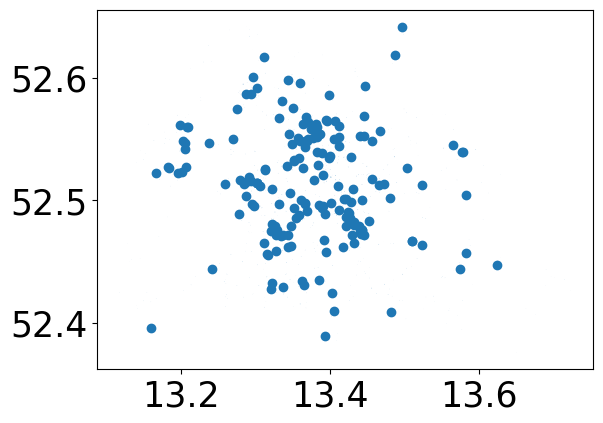

In [221]:
place_of_worship.plot()

In [222]:
# find place_of_worship counts in the grid
masks_place_of_worship = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = place_of_worship.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_place_of_worship.append(pip_mask)

#place_of_worship counts to the dataframe
place_of_worship_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    place_of_worship_count.append(place_of_worship[masks_place_of_worship[i]].shape[0])

berlin_polyframe_lat_long_new['place_of_worship_count'] = place_of_worship_count


100%|██████████| 3891/3891 [00:02<00:00, 1584.67it/s]


#### Detailed CSV SAVE

In [224]:
# save the dataframe
berlin_polyframe_lat_long_new.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/processed/{name}_data_detailed.csv")

In [ ]:
# list all the POIs used in this notebook

list = ['amenity=charging_station', 'amenity= parking', 'amenity=restaurant', 'amenity=library', 'amenity=university', 'amenity=school', 'leisure=park', 'amenity=cinema', 'amenity=townhall', 'amenity=community_centre', 'building=government', 'building=civic', 'building=commercial', 'building=retail', 'amenity=place_of_worship']